In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn import decomposition
from sklearn.cluster import KMeans
import sklearn.cluster as cluster
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import davies_bouldin_score
from sklearn.neighbors import NearestNeighbors

from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from kneed import KneeLocator

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.features.pcoords import parallel_coordinates
import plotly.express as px
import time
from tqdm.auto import tqdm
tqdm.pandas()

# Test des différentes méthodes de clustering

**Plan d'action**
Nous tentons ici différentes méthodes de clustering avec différentes features. L'objectif reste bien de pouvoir identifier des clusters utilies du point de vu métier, nous analyserons donc les clusters pour en identifier leurs caractéristiques.

Dans un premier temps nous allons utiliser l'algorithme k-means avec les 3 features de la RFM. Nous ajouterons ensuite certaines caracteristiques en fonction de leurs pertinences.

* [Lecture des données](#chapter1)
* [K-means sur les features RFM](#chapter2)
    * [Nombre de clusters optimal](#section_2_1)
    * [Analyse des clusters](#section_2_2)

## Lecture des données <a class="anchor" id="chapter1"></a>

In [5]:
data_X = pd.read_csv("data_cluster.csv")
data_X.drop(columns = 'Unnamed: 0', inplace = True)
data_X

,customer_unique_id,premier achat,delta_date,récence_x,prix_total,seller_id,seller_state,seller_city,seller_lat,seller_lng,...,review_score,payment_installments,payment_type,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin,récence_y,fréquence,profil client
0,b7d76e111c89f7ebf14761390f0f7d17,-729,0,-729,136.23,1554a68530182680ad5c8b042c3ab563,MG,monte siao,-22.432149,-46.582346,...,1.000000,1.0,credit_card,0.0,0.0,2.0,0.0,-729 days +12:08:22,1,DISPARU
1,32ea3bdedab835c3aa6cb68ce66565ef,-700,633,-67,137.16,522620dcb18a6b31cd7bdf73665113a9,PR,cascavel,-24.962426,-53.455592,...,4.666667,1.0,boleto,1.0,0.0,0.0,2.0,-67 days +02:39:07,2,REGULIER
2,2f64e403852e6893ae37485d5fcacdaf,-700,0,-700,39.09,f09b760d23495ac9a7e00d29b769007c,SP,catanduva,-21.141497,-48.993835,...,4.000000,1.0,boleto,1.0,0.0,0.0,0.0,-700 days +07:49:53,1,DISPARU
3,61db744d2f835035a5625b59350c6b63,-700,0,-700,53.73,45d33f715e24d15a6ccf5c17b3a23e3c,SP,sorocaba,-23.499521,-47.432923,...,3.000000,1.0,boleto,1.0,0.0,0.0,0.0,-700 days +12:06:39,1,DISPARU
4,8d3a54507421dbd2ce0a1d58046826e0,-700,0,-700,133.46,cca3071e3e9bb7d12640c9fbe2301306,SP,ibitinga,-21.754867,-48.838906,...,1.000000,6.0,credit_card,0.0,0.0,1.0,0.0,-700 days +12:59:06,1,DISPARU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,-5,0,-5,73.10,5f2684dab12e59f83bef73ae57724e45,SP,sao paulo,-23.506808,-46.740769,...,1.000000,7.0,credit_card,1.0,0.0,0.0,0.0,-5 days +03:19:02,1,NOUVEAU
91972,5c58de6fb80e93396e2f35642666b693,-5,0,-5,510.96,67bf6941ba2f1fa1d02c375766bc3e53,PR,curitiba,-25.382420,-49.353009,...,5.000000,8.0,credit_card,0.0,0.0,2.0,0.0,-5 days +05:11:26,1,NOUVEAU
91973,7febafa06d9d8f232a900a2937f04338,-5,0,-5,61.29,2a84855fd20af891be03bc5924d2b453,MG,belo horizonte,-19.915854,-43.937548,...,5.000000,1.0,voucher,0.0,0.0,0.0,1.0,-5 days +05:11:31,1,NOUVEAU
91974,b701bebbdf478f5500348f03aff62121,-5,0,-5,33.23,7d7866a99a8656a42c7ff6352a433410,SP,sao paulo,-23.557888,-46.639554,...,3.000000,1.0,credit_card,1.0,0.0,0.0,0.0,-5 days +05:45:03,1,NOUVEAU


## K-means sur les features RFM <a class="anchor" id="chapter2"></a>

In [6]:
# On isole nos features RFM
data_X_rfm = data_X[['récence_x','fréquence','prix_total']]
# On normalise dans un premier temps les données
scaler_rfm = StandardScaler()
data_X_rfm_scaled = scaler_rfm.fit_transform(data_X_rfm)

### Nombre de clusters optimal

In [7]:
# Nous allons chercher le nombre optimal de cluster avec comme indicateur
# nous cherchons entre 2 et 10

kmeans_params = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}


#### Distortion

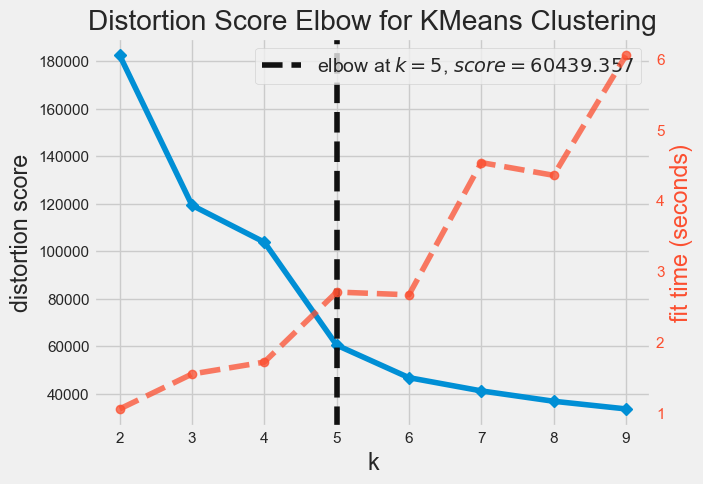

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [102]:
model = KMeans(**kmeans_params)
visualizer = KElbowVisualizer(model, k=(2, 10))
visualizer.fit(data_X_rfm_scaled)
visualizer.show()

**Le coude de l'arc se situe à 5 se qui suggère que le nombre de cluster le plus pertinent est au plus de 5**

#### Etudes des silouhette pour un nombre de cluster de 2 à 5

In [103]:
# Une liste contient les coefficients de silhouette pour chaque k
silhouette_coefficients = []

# Notez que vous commencez à 2 clusters pour le coefficient de silhouette.
for k in tqdm(range(2, 8)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_rfm_scaled)
    score = silhouette_score(data_X_rfm_scaled, kmeans.labels_)
    silhouette_coefficients.append(score)

  0%|          | 0/6 [00:00<?, ?it/s]

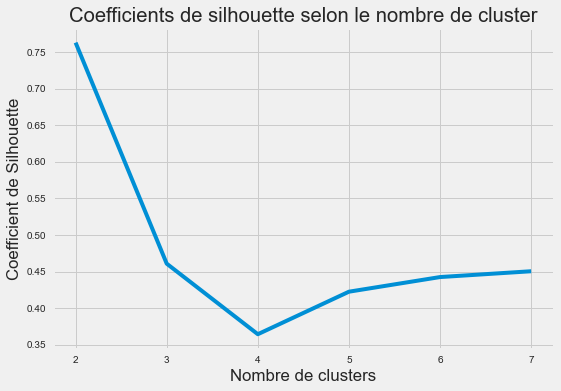

In [12]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 8), silhouette_coefficients)
plt.xticks(range(2, 8))
plt.xlabel("Nombre de clusters")
plt.ylabel("Coefficient de Silhouette")
plt.title("Coefficients de silhouette selon le nombre de cluster")
plt.show()

**Profil de silouhette**

  0%|          | 0/4 [00:00<?, ?it/s]

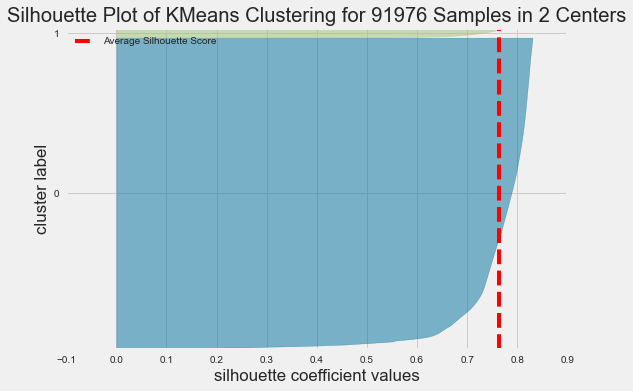

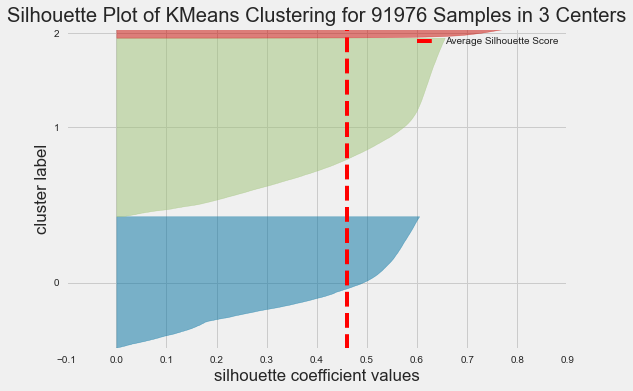

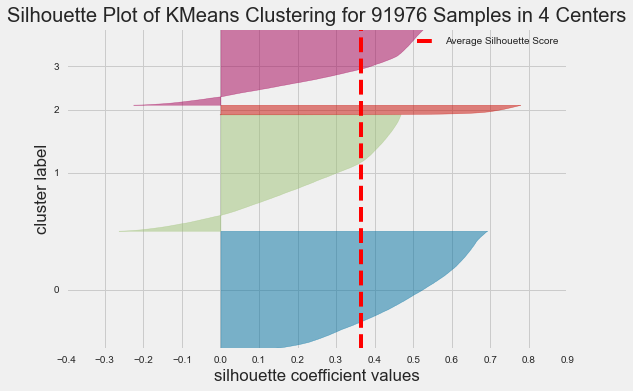

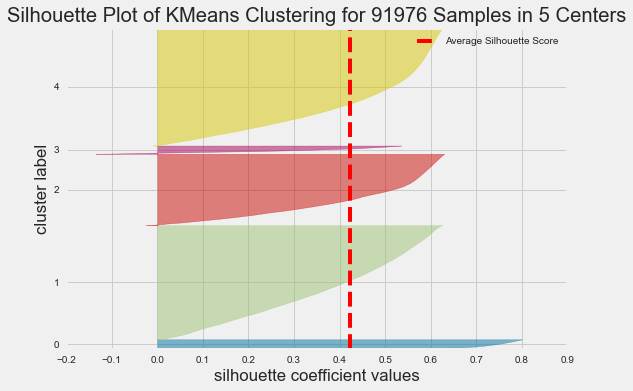

In [10]:
from yellowbrick.cluster import intercluster_distance

# Instanciation du modèle de clustering et du visualiseur

for n_cluster in tqdm(range(2, 6)):
    model = KMeans(n_cluster, **kmeans_params)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(data_X_rfm_scaled)  # Adapter les données au visualiseur
    visualizer.show()  # afficher la silhouette

## Index Davies Bouldin

In [15]:
davies_index = []

for k in tqdm(range(2, 8)):
    model = KMeans(n_clusters=k, **kmeans_params)
    model.fit(data_X_rfm_scaled)
    labels = model.labels_
    davies_index.append(davies_bouldin_score(data_X_rfm_scaled, labels))

  0%|          | 0/6 [00:00<?, ?it/s]

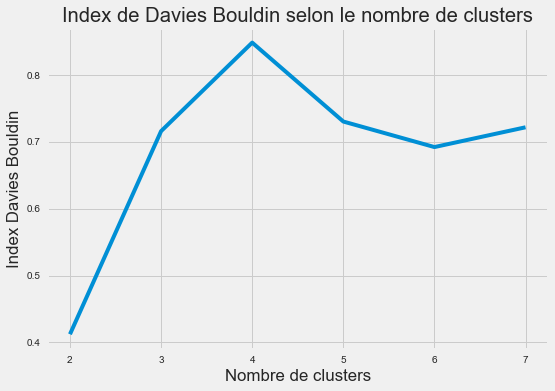

In [18]:
plt.plot(range(2, 8), davies_index)
plt.xticks(range(2, 8))
plt.xlabel("Nombre de clusters")
plt.ylabel("Index Davies Bouldin")
plt.title("Index de Davies Bouldin selon le nombre de clusters")
plt.show()

## Nombre d'individus par cluster

In [21]:
from collections import Counter


kmeans = KMeans(n_clusters=3, **kmeans_params)
kmeans.fit(data_X_rfm_scaled)
print(Counter(kmeans.labels_))

Counter({1: 51224, 0: 38006, 2: 2746})


In [22]:
for k in tqdm(range(2, 8)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_rfm_scaled)
    print(f'Dans le cas de {k} clusters nous avons la répartitions des individus suivante :')
    print(Counter(kmeans.labels_))

  0%|          | 0/6 [00:00<?, ?it/s]

Dans le cas de 2 clusters nous avons la répartitions des individus suivante :
Counter({0: 89230, 1: 2746})
Dans le cas de 3 clusters nous avons la répartitions des individus suivante :
Counter({1: 51224, 0: 38006, 2: 2746})
Dans le cas de 4 clusters nous avons la répartitions des individus suivante :
Counter({0: 33851, 1: 33392, 3: 21987, 2: 2746})
Dans le cas de 5 clusters nous avons la répartitions des individus suivante :
Counter({4: 33698, 1: 32712, 2: 20490, 0: 2720, 3: 2356})
Dans le cas de 6 clusters nous avons la répartitions des individus suivante :
Counter({3: 32661, 2: 31608, 0: 20047, 5: 4327, 4: 2713, 1: 620})
Dans le cas de 7 clusters nous avons la répartitions des individus suivante :
Counter({4: 30864, 0: 29916, 5: 19918, 6: 6415, 3: 2716, 1: 1833, 2: 314})


## Visualisation des clusters

Nous proposons de visualiser les clusterings de deux manières : 
- Par une ACP (qui retranscrit la structure globale des données)
- Par t-sne (qui retranscrit la structure locale des données)

### ACP pour k = [2,7]

[0.37611851 0.70903686]


  0%|          | 0/6 [00:00<?, ?it/s]

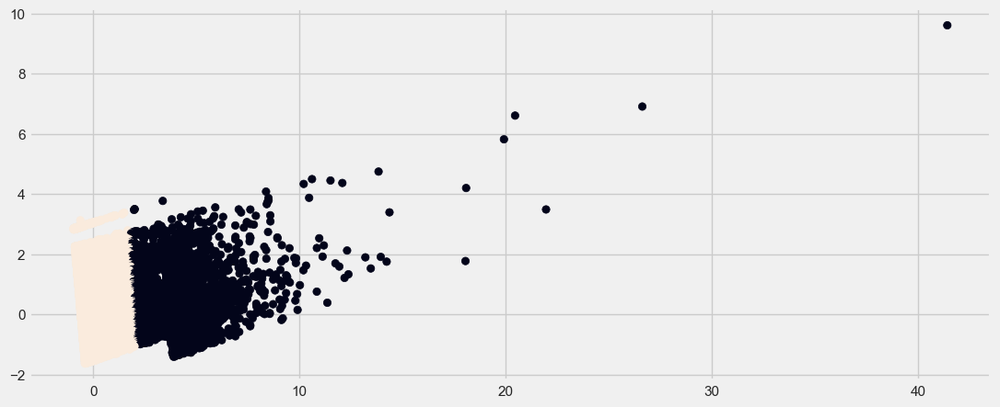

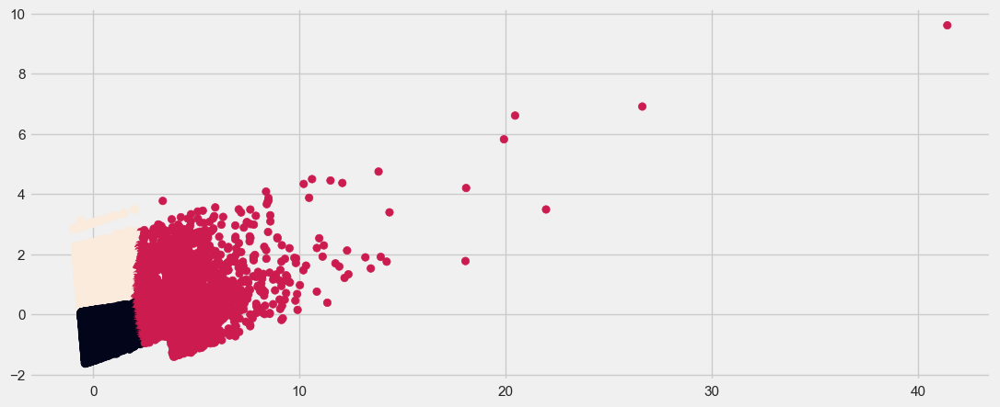

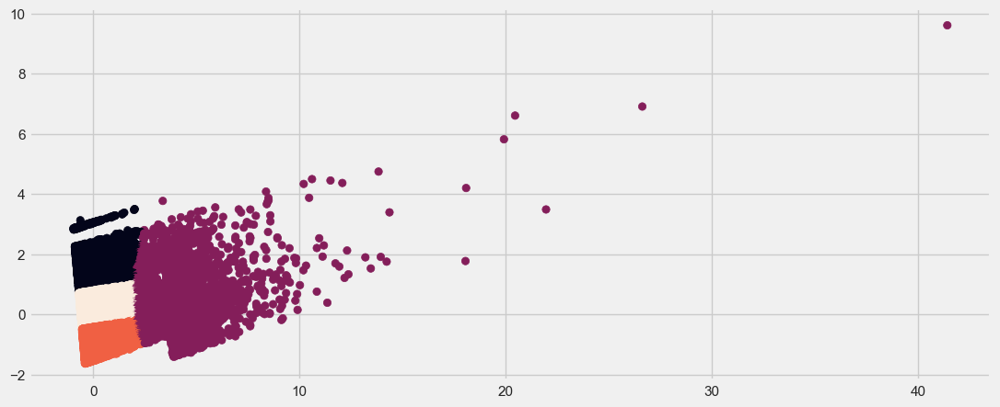

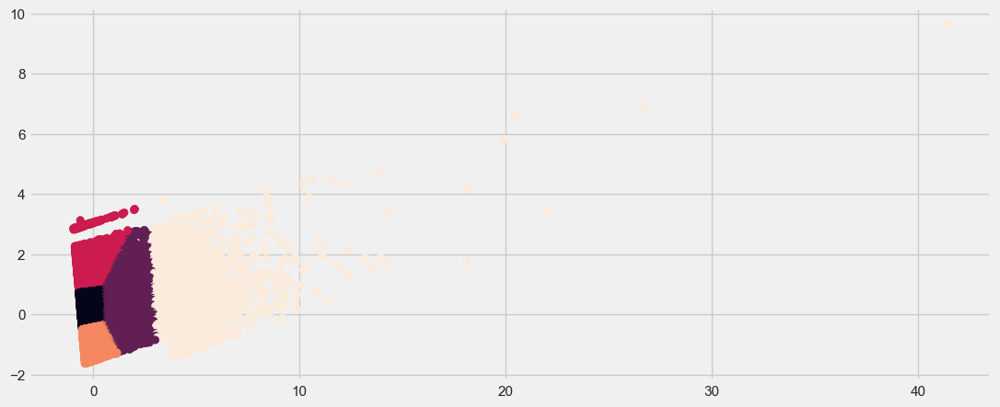

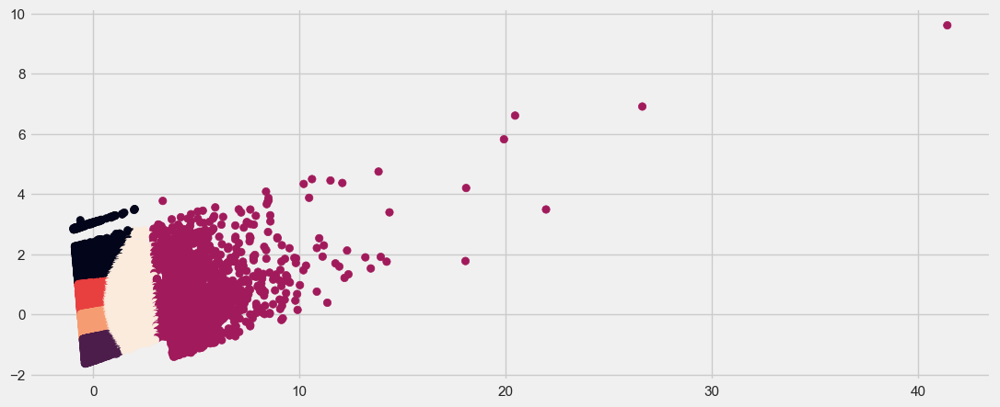

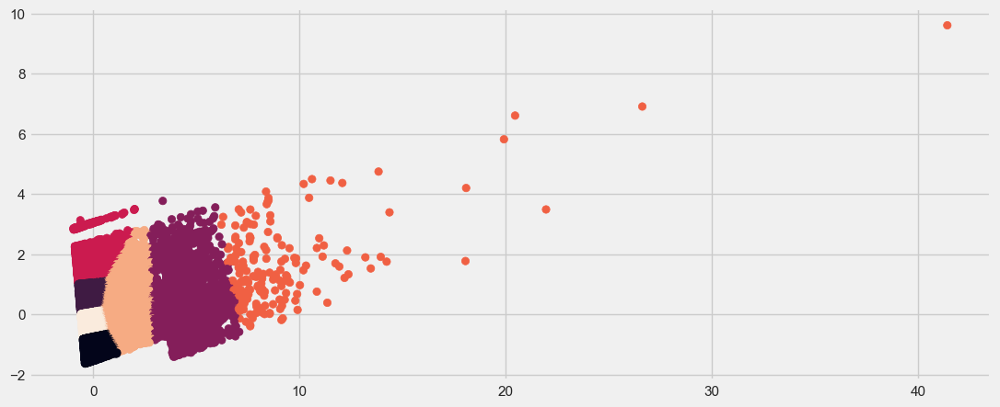

In [104]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 2)
pca.fit(data_X_rfm_scaled)

print(pca.explained_variance_ratio_.cumsum())
for k in tqdm(range(2, 8)):
    
    X_trans = pca.transform(data_X_rfm_scaled)

    fig = plt.figure(figsize = (12,5))
    cls = cluster.KMeans(n_clusters=k)
    cls.fit(X_trans)
    ax = fig.add_subplot(111)
    ax.scatter(X_trans[:,0],X_trans[:,1], c = cls.labels_)

### t-sne

La compléxité de cette méthodes nous pousse à utiliser seulement une partie des données.

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

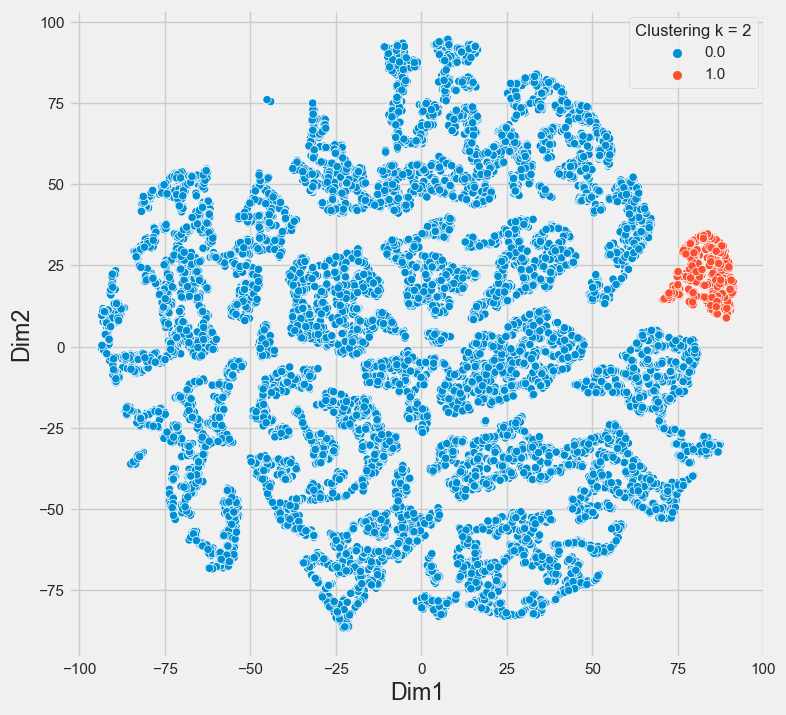

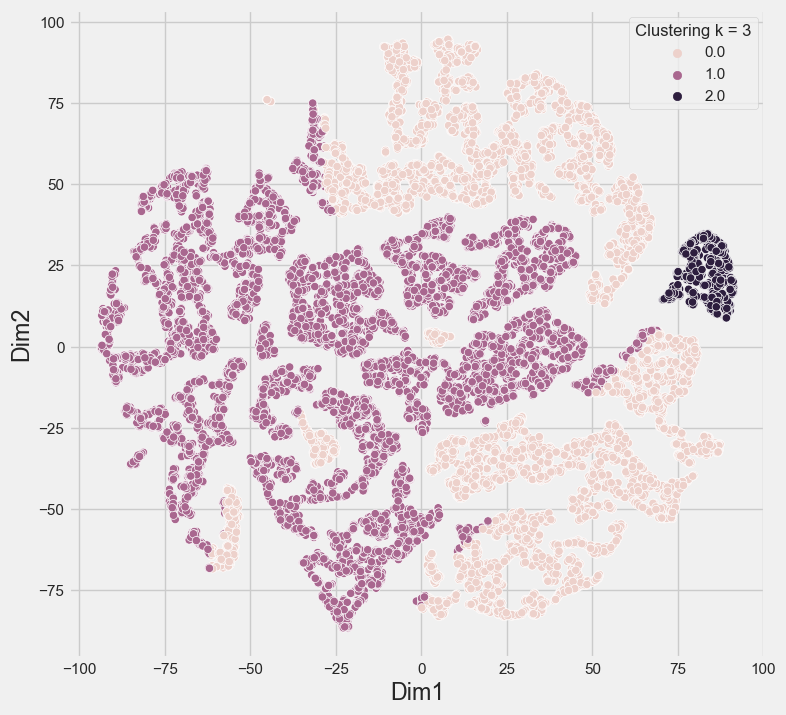

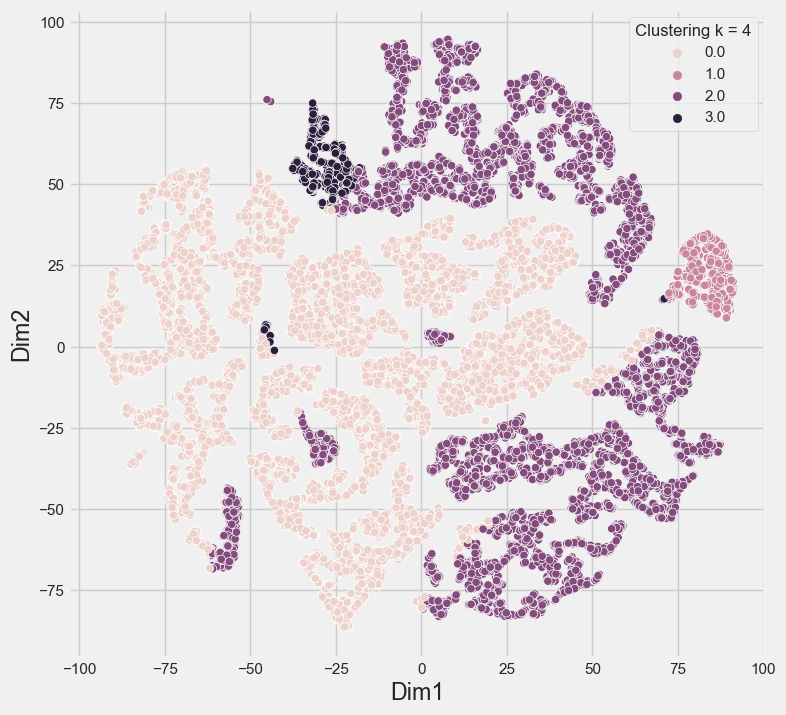

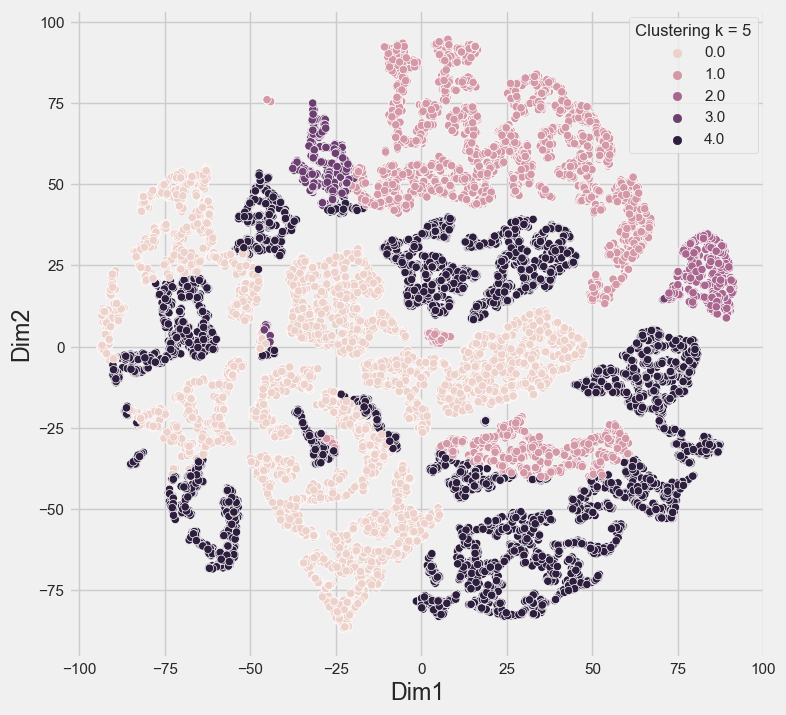

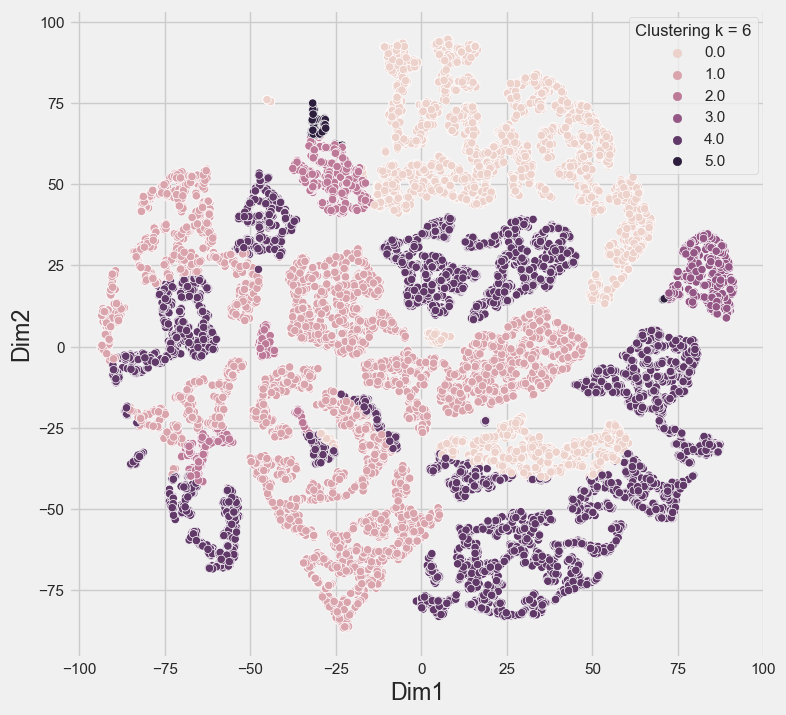

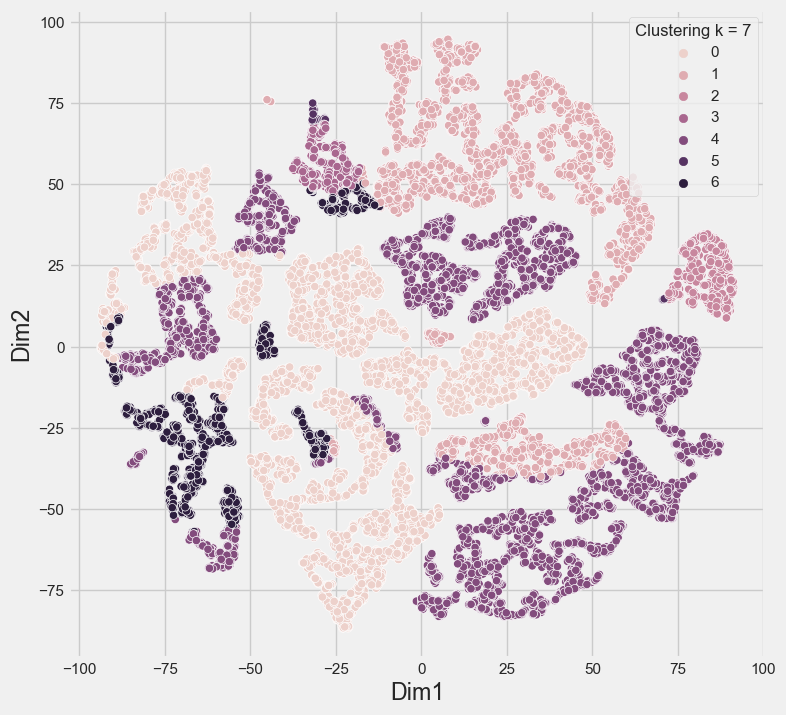

In [126]:
from sklearn.manifold import TSNE

scaler_rfm_sample = StandardScaler()
data_X_rfm_scaled = data_X[['récence_x','fréquence','prix_total']]
data_X_rfm_scaled = scaler_rfm_sample.fit_transform(data_X_rfm_scaled)
data_X_label = data_X[['récence_x','fréquence','prix_total']]

for k in tqdm(range(2, 8)):
    cls = cluster.KMeans(n_clusters=k)
    cls.fit(data_X_rfm_scaled)
    data_X_label['Cluster' + str(k)] =  cls.labels_

data_X_sample = data_X_label.sample(20000, random_state=42)

data_X_rfm_sample_scaled = scaler_rfm_sample.fit_transform(data_X_sample[['récence_x','fréquence','prix_total']])
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(data_X_rfm_sample_scaled)

for k in tqdm(range(2, 8)):
    X_tsne_data = np.vstack((X_tsne.T, data_X_sample['Cluster' + str(k)].values)).T
    df_tsne = pd.DataFrame(X_tsne_data, columns=['Dim1', 'Dim2', 'Clustering k = ' + str(k)])
    plt.figure(figsize=(8, 8))
    sns.scatterplot(data=df_tsne, hue= 'Clustering k = ' + str(k), x='Dim1', y='Dim2')
    plt.show()

## Etude des clusters d'un point de vu métier

Grâce aux méthodes précedentes nous avons plusieurs informations :
- L'analyse du coefficient de distortion nous indique qu'il serrait peu pertinant d'aller au delà de 5-6 clusters.
- L'étude de la taille des clusters nous montre qu'avec k = 6 clusters nous avons un groupe avec 600 individus, ce qui      
n'est pas pertient d'un point de vu métier.
- Le coefficient de silhouaite ainsi que score de Davies Bouldin nous poussent a exclure le cluster avec k = 4.
- Utiliser k = 2 est trop réducteur et ne peut pas mener à un résultat pertinent 
    
**En conclusion nous allons étudier les cluster avec k = 3 et 5 pour déterminer lequel des deux est le plus pertinent**

### Interpréter les cluster

#### K = 3

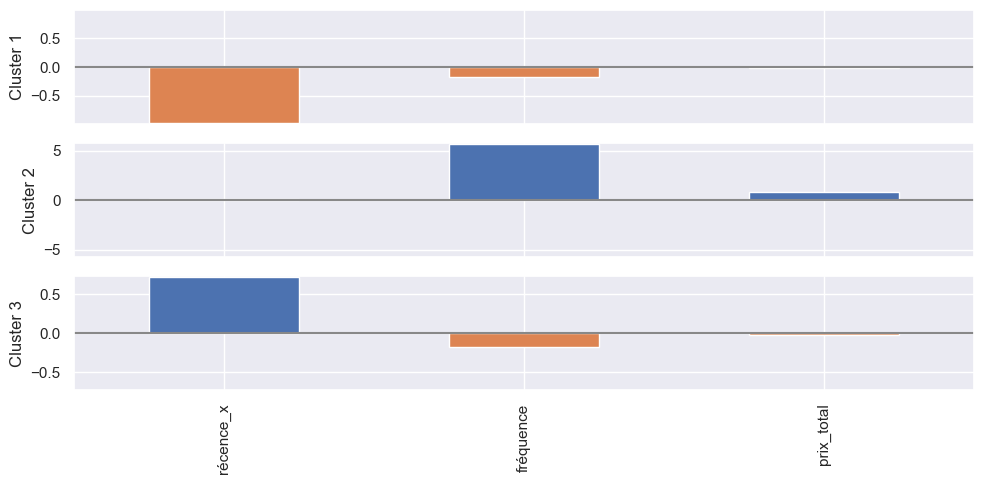

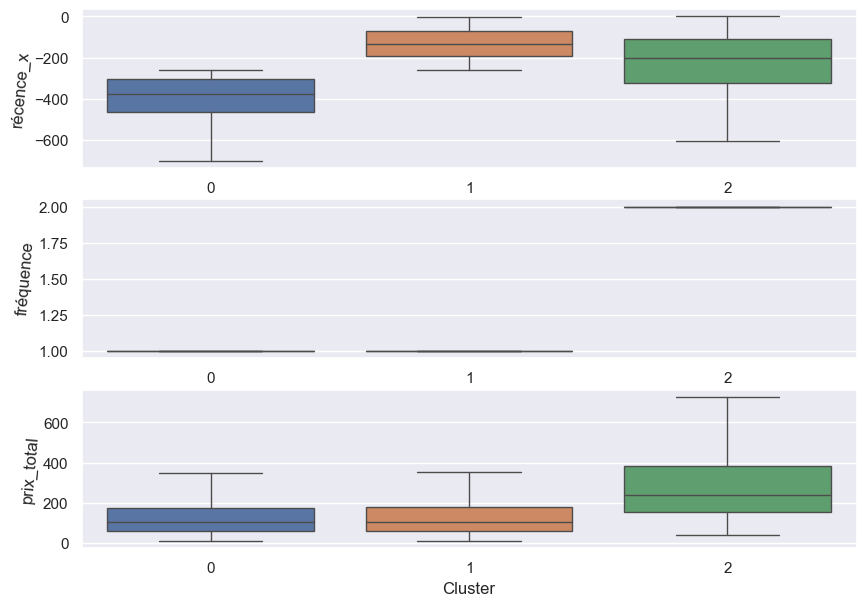

In [43]:
syms = data_X_rfm.columns.values
kmeans = KMeans(n_clusters=3).fit(data_X_rfm_scaled)
centers = pd.DataFrame(kmeans.cluster_centers_, columns=syms)

f, axes = plt.subplots(3, 1, figsize=(10, 5), sharex=True)
for i, ax in enumerate(axes):
    center = centers.loc[i, :]
    maxPC = 1.01 * np.max(np.max(np.abs(center)))
    colors = ['C0' if l > 0 else 'C1' for l in center]
    ax.axhline(color='#888888')
    center.plot.bar(ax=ax, color=colors)
    ax.set_ylabel(f'Cluster {i + 1}')
    ax.set_ylim(-maxPC, maxPC)

plt.tight_layout()
plt.show()

cls = cluster.KMeans(n_clusters=3)
cls.fit(data_X_rfm_scaled)
data_X_labaled = data_X_rfm.copy()
data_X_labaled['Cluster'] =  cls.labels_

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(10, 7))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='Cluster', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

**Analyse :**
- Le cluster 0 représente les clients qui ont acheté une seule fois il y a longtemps.
- Le cluster 1 représente les clients plus récents qui ont acheté une seule fois il y a longtemps
- Le cluster 2 représente les client ayant commandé plus d'une seule fois.

**En conclusion :**
Avec k=3 le clustering semble trop pauvre, le montant n'est par exemple pas pris en compte pour la création des clusters.

#### K = 5

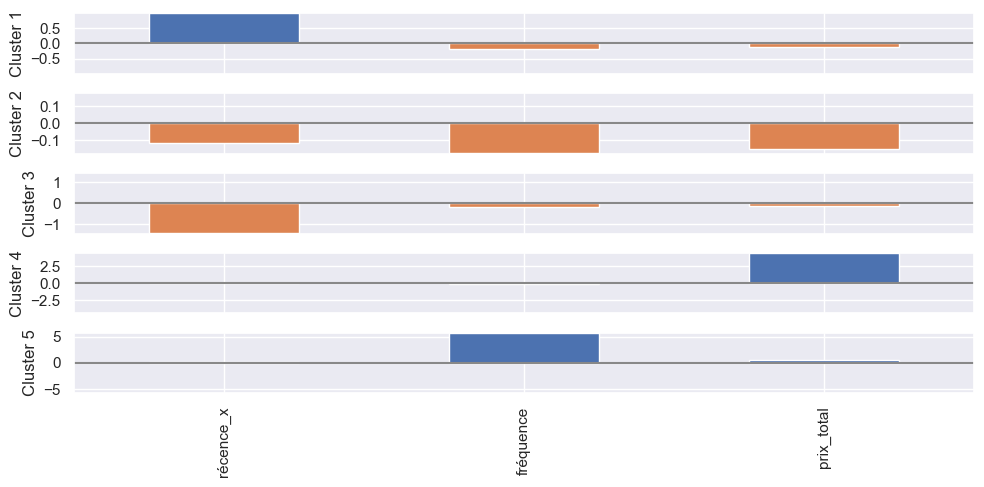

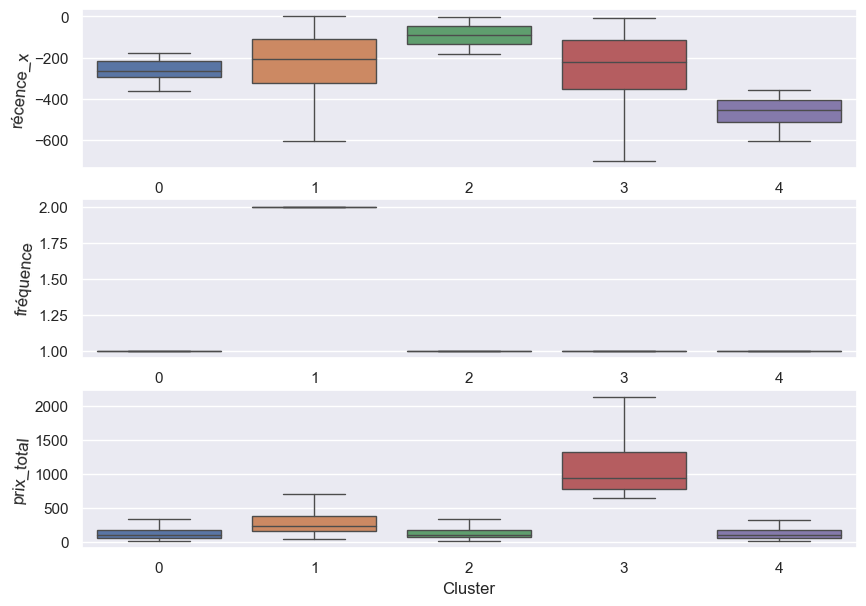

In [44]:
syms = data_X_rfm.columns.values
kmeans = KMeans(n_clusters=5).fit(data_X_rfm_scaled)
centers = pd.DataFrame(kmeans.cluster_centers_, columns=syms)

f, axes = plt.subplots(5, 1, figsize=(10, 5), sharex=True)
for i, ax in enumerate(axes):
    center = centers.loc[i, :]
    maxPC = 1.01 * np.max(np.max(np.abs(center)))
    colors = ['C0' if l > 0 else 'C1' for l in center]
    ax.axhline(color='#888888')
    center.plot.bar(ax=ax, color=colors)
    ax.set_ylabel(f'Cluster {i + 1}')
    ax.set_ylim(-maxPC, maxPC)

plt.tight_layout()
plt.show()

cls = cluster.KMeans(n_clusters=5)
cls.fit(data_X_rfm_scaled)
data_X_labaled = data_X_rfm.copy()
data_X_labaled['Cluster'] =  cls.labels_

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(10, 7))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='Cluster', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

**Analyse :**
Nous allons regarder cette fois-ci en fonction des variables 

- La récence : 3 groupes se distinguent en fonction de la date du dernier achat :
        - Le cluster 2 pour les client les plus récents
        - Le cluster 4 pour les clients les plus anciens
        - Le cluster 0 pour les clients moyennement ancients 
- La fréquence : le cluster 1 se différencie car il comporte les clients ayant commandé plus d'une fois
- Le montant :  Le cluster 3 représente les clients qui dépensent le plus

**En conclusion :**
Avec k=5 nous avons obtenu un clustering simplement interprétable et pertinent d'un point de vu métier. 

In [46]:
# Ajouter des features :
pd.set_option('display.max_columns', None)
data_X = pd.read_csv("data_cluster.csv")
data_X.drop(columns = 'Unnamed: 0', inplace = True)
data_X

,customer_unique_id,premier achat,delta_date,récence_x,prix_total,seller_id,seller_state,seller_city,seller_lat,seller_lng,customer_city,customer_state,customer_lat,customer_lng,product_weight_g,volume_cm_3,review_score,payment_installments,payment_type,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin,récence_y,fréquence,profil client
0,b7d76e111c89f7ebf14761390f0f7d17,-729,0,-729,136.23,1554a68530182680ad5c8b042c3ab563,MG,monte siao,-22.432149,-46.582346,boa vista,RR,2.809871,-60.702822,1600.000000,5376.000000,1.000000,1.0,credit_card,0.0,0.0,2.0,0.0,-729 days +12:08:22,1,DISPARU
1,32ea3bdedab835c3aa6cb68ce66565ef,-700,633,-67,137.16,522620dcb18a6b31cd7bdf73665113a9,PR,cascavel,-24.962426,-53.455592,sao paulo,SP,-23.580782,-46.637535,366.666667,2410.666667,4.666667,1.0,boleto,1.0,0.0,0.0,2.0,-67 days +02:39:07,2,REGULIER
2,2f64e403852e6893ae37485d5fcacdaf,-700,0,-700,39.09,f09b760d23495ac9a7e00d29b769007c,SP,catanduva,-21.141497,-48.993835,panambi,RS,-28.289868,-53.509803,400.000000,4096.000000,4.000000,1.0,boleto,1.0,0.0,0.0,0.0,-700 days +07:49:53,1,DISPARU
3,61db744d2f835035a5625b59350c6b63,-700,0,-700,53.73,45d33f715e24d15a6ccf5c17b3a23e3c,SP,sorocaba,-23.499521,-47.432923,porto alegre,RS,-30.040976,-51.209163,767.000000,4160.000000,3.000000,1.0,boleto,1.0,0.0,0.0,0.0,-700 days +12:06:39,1,DISPARU
4,8d3a54507421dbd2ce0a1d58046826e0,-700,0,-700,133.46,cca3071e3e9bb7d12640c9fbe2301306,SP,ibitinga,-21.754867,-48.838906,hortolandia,SP,-22.894335,-47.164022,2050.000000,14960.000000,1.000000,6.0,credit_card,0.0,0.0,1.0,0.0,-700 days +12:59:06,1,DISPARU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,-5,0,-5,73.10,5f2684dab12e59f83bef73ae57724e45,SP,sao paulo,-23.506808,-46.740769,sao paulo,SP,-23.673283,-46.765665,1500.000000,11088.000000,1.000000,7.0,credit_card,1.0,0.0,0.0,0.0,-5 days +03:19:02,1,NOUVEAU
91972,5c58de6fb80e93396e2f35642666b693,-5,0,-5,510.96,67bf6941ba2f1fa1d02c375766bc3e53,PR,curitiba,-25.382420,-49.353009,curitiba,PR,-25.427210,-49.255685,13550.000000,115248.000000,5.000000,8.0,credit_card,0.0,0.0,2.0,0.0,-5 days +05:11:26,1,NOUVEAU
91973,7febafa06d9d8f232a900a2937f04338,-5,0,-5,61.29,2a84855fd20af891be03bc5924d2b453,MG,belo horizonte,-19.915854,-43.937548,paracatu,MG,-17.230218,-46.861293,1614.000000,13888.000000,5.000000,1.0,voucher,0.0,0.0,0.0,1.0,-5 days +05:11:31,1,NOUVEAU
91974,b701bebbdf478f5500348f03aff62121,-5,0,-5,33.23,7d7866a99a8656a42c7ff6352a433410,SP,sao paulo,-23.557888,-46.639554,sao caetano do sul,SP,-23.620662,-46.562402,450.000000,4788.000000,3.000000,1.0,credit_card,1.0,0.0,0.0,0.0,-5 days +05:45:03,1,NOUVEAU


## Ajouter des features

Nous avons une première segmentation pertinente, nous allons néamoins ajouter deux nouvelles features afin d'obtenir potentiellement des résultats plus intéressants.
Nous suivons la même démarche que précedement

In [8]:
# On isole nos features RFM 
data_X_rfmrp = data_X[['récence_x','fréquence','prix_total','review_score','payment_installments']]


**Dans la partie analyse nous avions remarqué qu'environ 50% des clients utilisaient un payement en plusieurs fois.
Nous alons donc séparer la variable payment_installments en deux catégories pour faciliter l'analyse des clusters.**

In [9]:
def lambda_paiement(x):
    res = 1
    if x > 1 :
        res = 2
    return res

data_X_rfmrp['payment_installments'] = data_X_rfmrp['payment_installments'].apply(lambda_paiement)

In [10]:
# On normalise ensuite les données
scaler_rfmrp = StandardScaler()
data_X_rfmrp_scaled = scaler_rfm.fit_transform(data_X_rfmrp)

In [11]:
data_X_rfmrp

,récence_x,fréquence,prix_total,review_score,payment_installments
0,-729,1,136.23,1.000000,1
1,-67,2,137.16,4.666667,1
2,-700,1,39.09,4.000000,1
3,-700,1,53.73,3.000000,1
4,-700,1,133.46,1.000000,2
...,...,...,...,...,...
91971,-5,1,73.10,1.000000,2
91972,-5,1,510.96,5.000000,2
91973,-5,1,61.29,5.000000,1
91974,-5,1,33.23,3.000000,1


**Distortion**

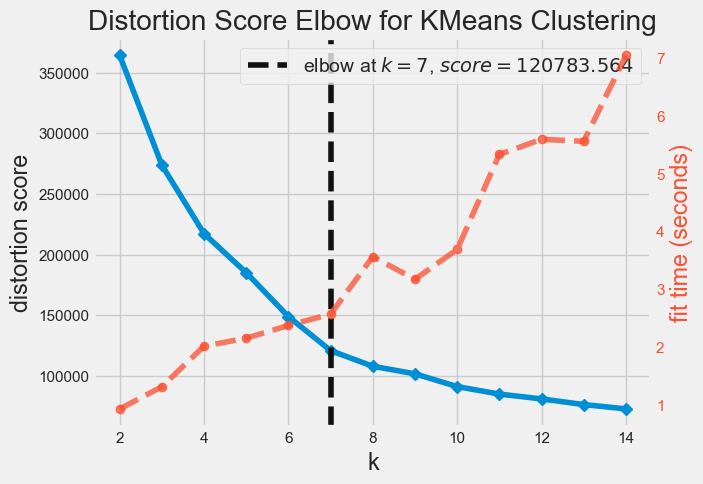

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [71]:
model = KMeans(**kmeans_params)
visualizer = KElbowVisualizer(model, k=(2, 15))
visualizer.fit(data_X_rfmrp_scaled)
visualizer.show()

In [60]:
# Une liste contient les coefficients de silhouette pour chaque k
silhouette_coefficients = []

# Notez que vous commencez à 2 clusters pour le coefficient de silhouette.
for k in tqdm(range(2, 10)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_rfmrp_scaled)
    score = silhouette_score(data_X_rfmrp_scaled, kmeans.labels_)
    silhouette_coefficients.append(score)

  0%|          | 0/8 [00:00<?, ?it/s]

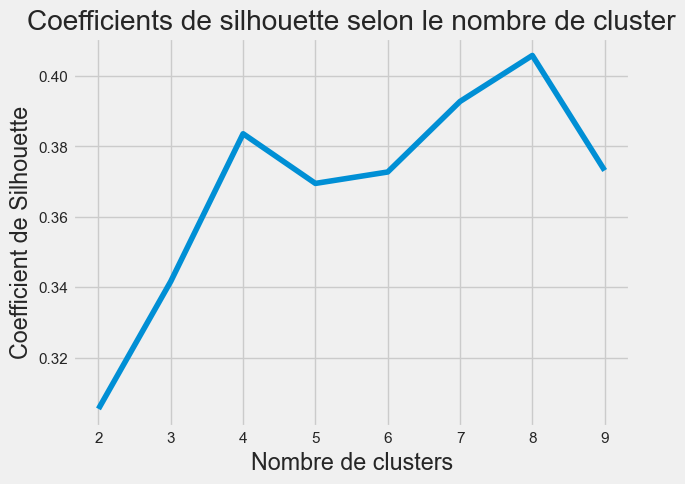

In [62]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 10), silhouette_coefficients)
plt.xticks(range(2, 10))
plt.xlabel("Nombre de clusters")
plt.ylabel("Coefficient de Silhouette")
plt.title("Coefficients de silhouette selon le nombre de cluster")
plt.show()

In [65]:
davies_index = []

for k in tqdm(range(2, 10)):
    model = KMeans(n_clusters=k, **kmeans_params)
    model.fit(data_X_rfmrp_scaled)
    labels = model.labels_
    davies_index.append(davies_bouldin_score(data_X_rfmrp_scaled, labels))

  0%|          | 0/8 [00:00<?, ?it/s]

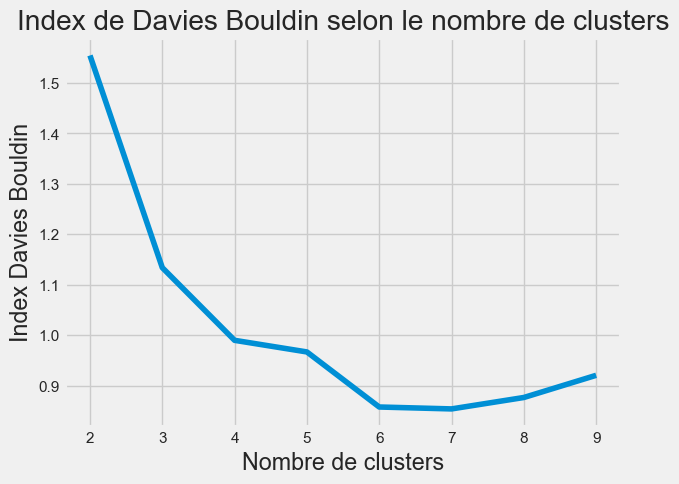

In [66]:
plt.plot(range(2, 10), davies_index)
plt.xticks(range(2, 10))
plt.xlabel("Nombre de clusters")
plt.ylabel("Index Davies Bouldin")
plt.title("Index de Davies Bouldin selon le nombre de clusters")
plt.show()

In [70]:
for k in tqdm(range(2, 10)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_rfmrp_scaled)
    print(f'Dans le cas de {k} clusters nous avons la répartitions des individus suivante :')
    print(Counter(kmeans.labels_))

  0%|          | 0/8 [00:00<?, ?it/s]

Dans le cas de 2 clusters nous avons la répartitions des individus suivante :
Counter({0: 47568, 1: 44408})
Dans le cas de 3 clusters nous avons la répartitions des individus suivante :
Counter({2: 45738, 1: 43494, 0: 2744})
Dans le cas de 4 clusters nous avons la répartitions des individus suivante :
Counter({2: 39148, 3: 38068, 1: 12015, 0: 2745})
Dans le cas de 5 clusters nous avons la répartitions des individus suivante :
Counter({2: 30288, 1: 27828, 3: 19227, 0: 11889, 4: 2744})
Dans le cas de 6 clusters nous avons la répartitions des individus suivante :
Counter({1: 37732, 4: 22598, 0: 15478, 5: 11568, 3: 2715, 2: 1885})
Dans le cas de 7 clusters nous avons la répartitions des individus suivante :
Counter({3: 22478, 4: 20944, 2: 17088, 5: 15495, 1: 11476, 6: 2715, 0: 1780})
Dans le cas de 8 clusters nous avons la répartitions des individus suivante :
Counter({1: 21010, 2: 19795, 0: 16333, 4: 14698, 6: 8180, 5: 7525, 7: 2714, 3: 1721})
Dans le cas de 9 clusters nous avons la répar

[0.24964977 0.45510379]


  0%|          | 0/4 [00:00<?, ?it/s]

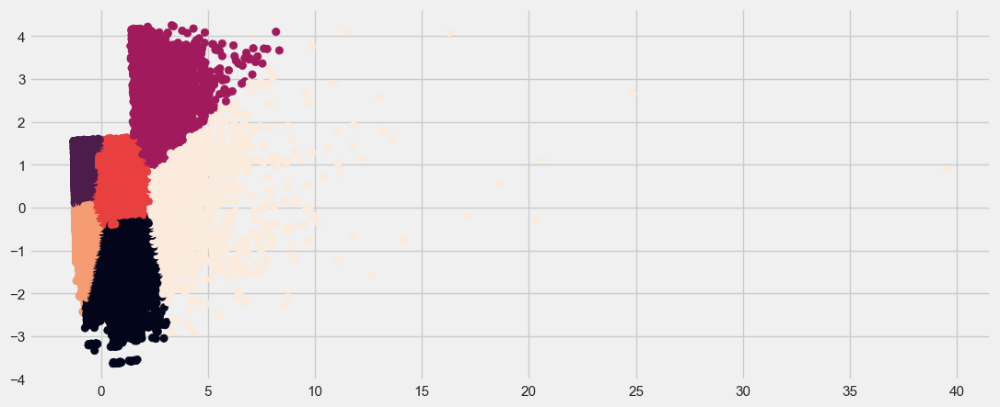

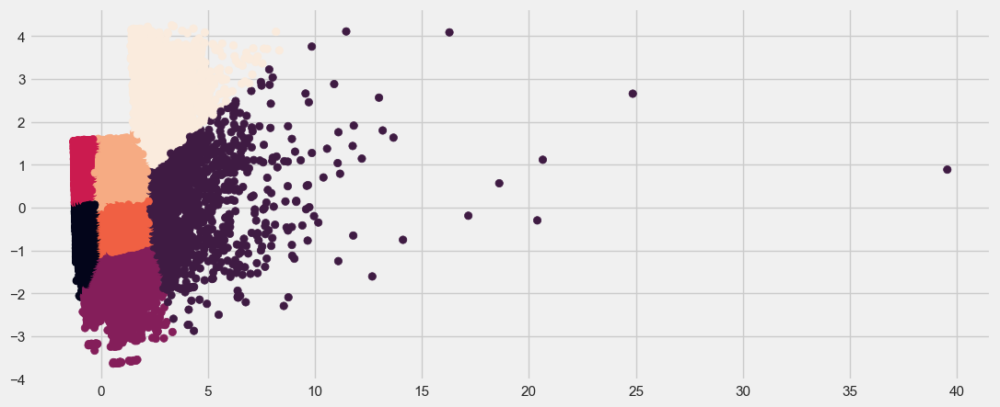

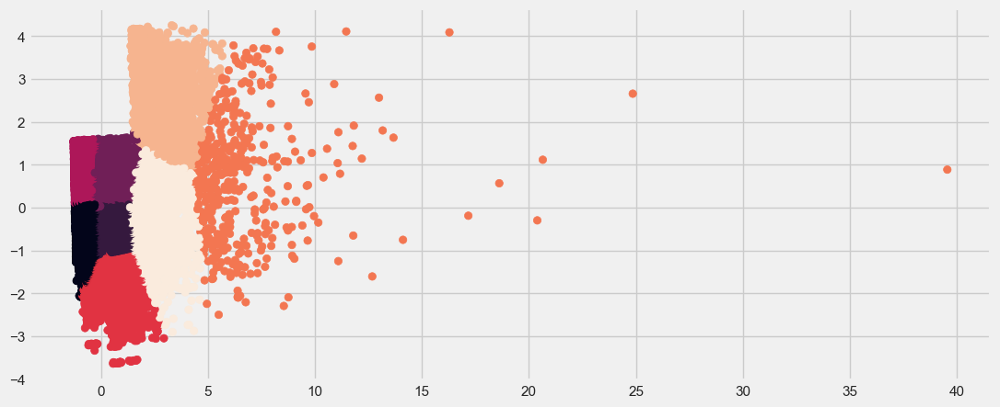

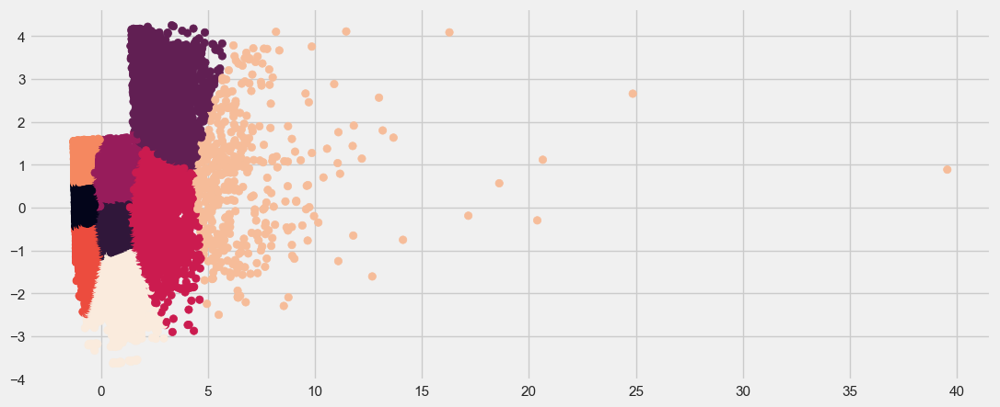

In [68]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 2)
pca.fit(data_X_rfmrp_scaled)

print(pca.explained_variance_ratio_.cumsum())
for k in tqdm(range(6, 10)):
    
    X_trans = pca.transform(data_X_rfmrp_scaled)

    fig = plt.figure(figsize = (12,5))
    cls = cluster.KMeans(n_clusters=k)
    cls.fit(X_trans)
    ax = fig.add_subplot(111)
    ax.scatter(X_trans[:,0],X_trans[:,1], c = cls.labels_)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

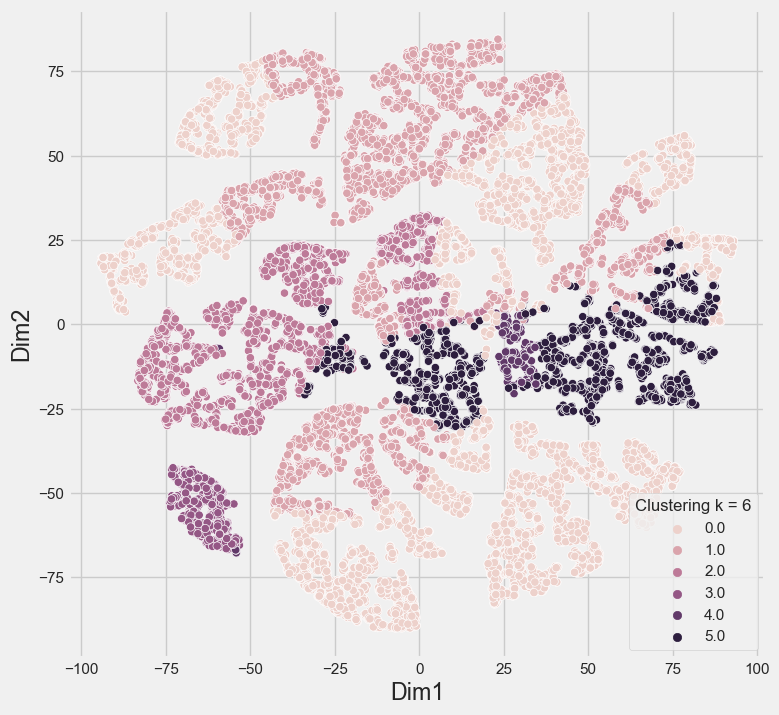

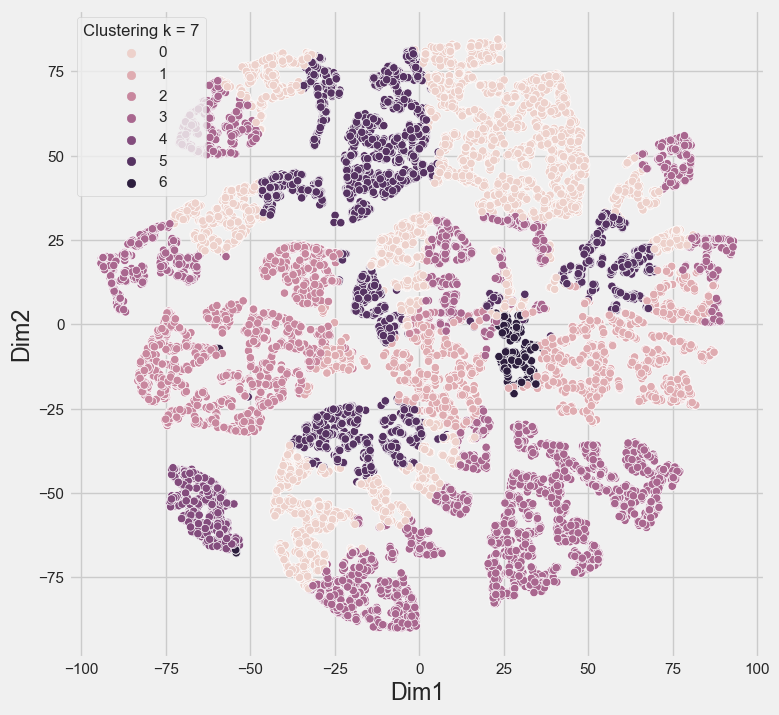

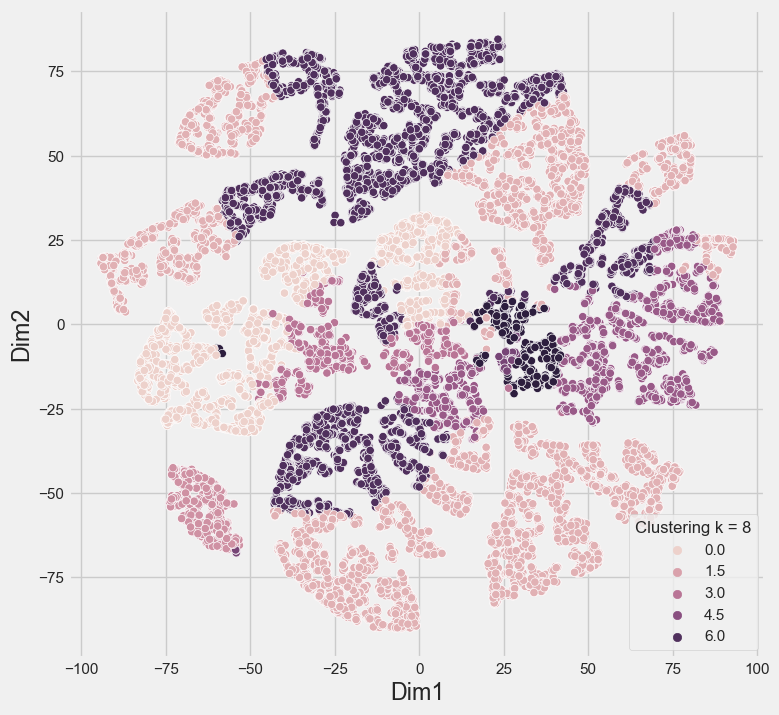

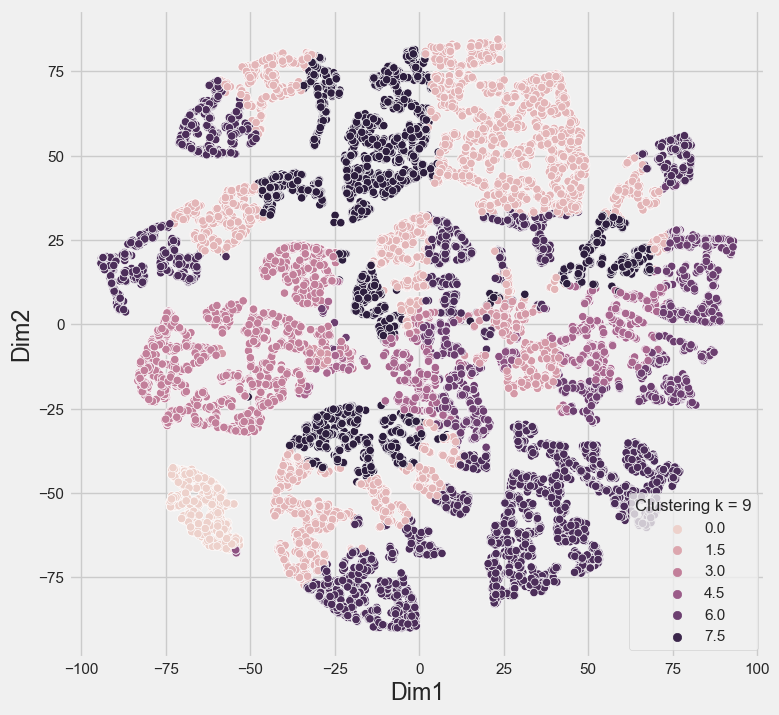

In [130]:
from sklearn.manifold import TSNE

scaler_rfm_sample = StandardScaler()
data_X_rfm_scaled = data_X[['récence_x','fréquence','prix_total','review_score','payment_installments']]
data_X_rfm_scaled = scaler_rfm_sample.fit_transform(data_X_rfm_scaled)
data_X_label = data_X[['récence_x','fréquence','prix_total','review_score','payment_installments']]

for k in tqdm(range(6, 10)):
    cls = cluster.KMeans(n_clusters=k)
    cls.fit(data_X_rfm_scaled)
    data_X_label['Cluster' + str(k)] =  cls.labels_

data_X_sample = data_X_label.sample(20000, random_state=42)

data_X_rfm_sample_scaled = scaler_rfm_sample.fit_transform(data_X_sample[['récence_x','fréquence','prix_total','review_score','payment_installments']])
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(data_X_rfm_sample_scaled)

for k in tqdm(range(6, 10)):
    X_tsne_data = np.vstack((X_tsne.T, data_X_sample['Cluster' + str(k)].values)).T
    df_tsne = pd.DataFrame(X_tsne_data, columns=['Dim1', 'Dim2', 'Clustering k = ' + str(k)])
    plt.figure(figsize=(8, 8))
    sns.scatterplot(data=df_tsne, hue= 'Clustering k = ' + str(k), x='Dim1', y='Dim2')
    plt.show()

In [80]:
for k in tqdm(range(2, 10)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_rfmrp_scaled)
    print(f'Dans le cas de {k} clusters nous avons la répartitions des individus suivante :')
    print(Counter(kmeans.labels_))

  0%|          | 0/8 [00:00<?, ?it/s]

Dans le cas de 2 clusters nous avons la répartitions des individus suivante :
Counter({0: 47568, 1: 44408})
Dans le cas de 3 clusters nous avons la répartitions des individus suivante :
Counter({2: 45738, 1: 43494, 0: 2744})
Dans le cas de 4 clusters nous avons la répartitions des individus suivante :
Counter({2: 39148, 3: 38068, 1: 12015, 0: 2745})
Dans le cas de 5 clusters nous avons la répartitions des individus suivante :
Counter({2: 30288, 1: 27828, 3: 19227, 0: 11889, 4: 2744})
Dans le cas de 6 clusters nous avons la répartitions des individus suivante :
Counter({1: 37732, 4: 22598, 0: 15478, 5: 11568, 3: 2715, 2: 1885})
Dans le cas de 7 clusters nous avons la répartitions des individus suivante :
Counter({3: 22478, 4: 20944, 2: 17088, 5: 15495, 1: 11476, 6: 2715, 0: 1780})
Dans le cas de 8 clusters nous avons la répartitions des individus suivante :
Counter({1: 21010, 2: 19795, 0: 16333, 4: 14698, 6: 8180, 5: 7525, 7: 2714, 3: 1721})
Dans le cas de 9 clusters nous avons la répar

**Suite à cette première analyse nous allons nous opter pour k = 8 clusters**


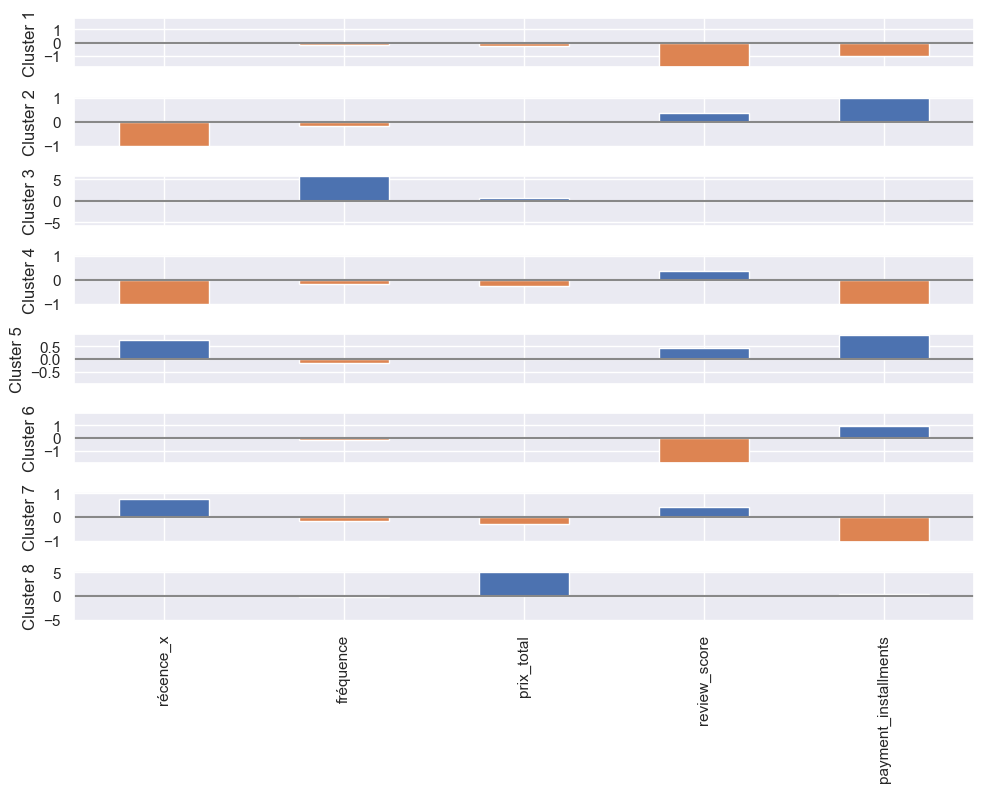

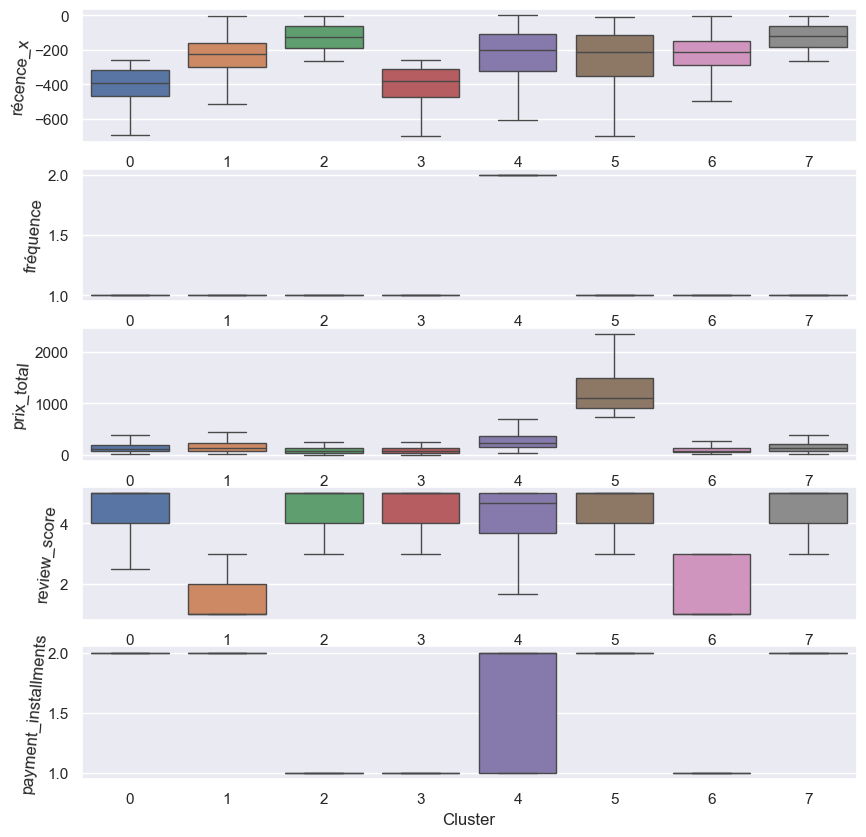

In [15]:
syms = data_X_rfmrp.columns.values
kmeans = KMeans(n_clusters=8).fit(data_X_rfmrp_scaled)
centers = pd.DataFrame(kmeans.cluster_centers_, columns=syms)

f, axes = plt.subplots(8, 1, figsize=(10, 8), sharex=True)
for i, ax in enumerate(axes):
    center = centers.loc[i, :]
    maxPC = 1.01 * np.max(np.max(np.abs(center)))
    colors = ['C0' if l > 0 else 'C1' for l in center]
    ax.axhline(color='#888888')
    center.plot.bar(ax=ax, color=colors)
    ax.set_ylabel(f'Cluster {i + 1}')
    ax.set_ylim(-maxPC, maxPC)

plt.tight_layout()
plt.show()

cls = cluster.KMeans(n_clusters=8)
cls.fit(data_X_rfmrp_scaled)
data_X_labaled = data_X_rfmrp.copy()
data_X_labaled['Cluster'] =  cls.labels_

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(10, 10))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='Cluster', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

### Analyse

Nous pouvons aisément faire la comparaison avec le clustering précedent :
Nous avons toujours notre cluster avec les clients qui ont passé plus d'une seule commande (cluster numéro 2) ainsi que celui dont le montant total est élevé (cluster 5)

Les autres clusters se définissent de façon binaires en fonction du payment_installments : par exemple le cluster (0 et 1), ( 3 et 7) et (4 et 6) sont presque identiques.
Ces 3 paires de clusters sont similaires au clustering précédent : 
    - (0 et 1) Nouveaux clients
    - (3 et 7) Clients moyennement ancien
    - (4 et 6) Clients ancien

In [84]:
data_X_labaled.groupby(by ="Cluster").describe()

récence_x                                                              \
            count        mean         std    min     25%    50%    75%    max   
Cluster                                                                         
0         19803.0 -125.454123   72.096852 -267.0 -186.00 -122.0  -63.0   -5.0   
1         21020.0 -127.772169   73.521616 -264.0 -192.00 -126.0  -62.0   -5.0   
2          2714.0 -225.401621  144.518439 -697.0 -323.75 -204.0 -109.0    0.0   
3          7534.0 -232.636979  126.375646 -729.0 -290.00 -211.5 -150.0   -5.0   
4         14678.0 -397.947541   97.195198 -700.0 -473.75 -384.0 -311.0 -259.0   
5          1724.0 -237.735499  152.030370 -699.0 -352.25 -215.0 -112.0   -9.0   
6         16322.0 -397.792856   93.328659 -700.0 -468.00 -390.0 -316.0 -259.0   
7          8181.0 -242.070652  128.124972 -700.0 -301.00 -223.0 -160.0   -5.0   

        fréquence                                              prix_total  \
            count      mean       std  min  25%  50%  75%  max      count   
Cluster                                                                     
0         19803.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0    19803.0   
1         21020.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0    21020.0   
2          2714.0  2.000000  0.000000  2.0  2.0  2.0  2.0  2.0     2714.0   
3          7534.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0     7534.0   
4         14678.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0    14678.0   
5          1724.0  1.015661  0.124197  1.0  1.0  1.0  1.0  2.0     1724.0   
6         16322.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0    16322.0   
7          8181.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0     8181.0   

                                                                         \
                mean         std     min       25%       50%        75%   
Cluster                                                                   
0         167.171211  125.492571   20.19   83.2300   134.190   204.8100   
1         104.763838   91.436518    9.59   47.6400    76.740   128.4550   
2         307.923968  239.253098   37.34  152.2400   236.580   373.6525   
3         117.990223  107.038984   13.78   52.4100    84.925   143.3550   
4         108.503526   97.279128   10.07   50.0000    77.570   131.5650   
5        1323.926125  716.649983  732.29  904.7475  1108.630  1479.8150   
6         160.700243  127.637990   20.08   75.0700   124.050   198.2025   
7         184.527788  146.355558   20.45   85.1400   142.270   226.7400   

                  review_score                                               \
              max        count      mean       std  min       25%       50%   
Cluster                                                                       
0          792.17      19803.0  4.675049  0.557312  3.0  4.000000  5.000000   
1          788.23      21020.0  4.706922  0.510615  3.0  4.000000  5.000000   
2         1653.98       2714.0  4.176266  1.104601  1.0  3.666667  4.666667   
3          876.50       7534.0  1.741771  0.876547  1.0  1.000000  1.000000   
4          816.33      14678.0  4.640516  0.585850  2.0  4.000000  5.000000   
5        13664.08       1724.0  4.067505  1.378194  1.0  4.000000  5.000000   
6          821.98      16322.0  4.632092  0.597116  2.0  4.000000  5.000000   
7          873.86       8181.0  1.631830  0.826855  1.0  1.000000  1.000000   

                  payment_installments                                     \
         75%  max                count      mean       std  min  25%  50%   
Cluster                                                                     
0        5.0  5.0              19803.0  2.000000  0.000000  2.0  2.0  2.0   
1        5.0  5.0              21020.0  1.000000  0.000000  1.0  1.0  1.0   
2        5.0  5.0               2714.0  1.642962  0.479214  1.0  1.0  2.0   
3        3.0  3.0               7534.0  1.000000  0.000000  1.0  1.0  1.0   
4        5.0  5.0              14

# D'autres algorithmes de clustering :

Dans notre démarche nous voulons proposer différents clusterings :
- Un DBSCAN
- Un clustering hierarchique  

## DBSCAN

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html


Les points forts des méthodes de clustering basées sur la densité sont les suivants :

- Elles excellent dans l’identification de clusters de formes non sphériques.


- Elles sont résistantes aux valeurs aberrantes.


Les faiblesses des méthodes de clustering basées sur la densité sont les suivantes :

- Elles ne sont pas bien adaptées au clustering dans des espaces à haute dimension.


- Elles ont des difficultés à identifier des clusters de densités variables.

A la différence du Kmeans, le paramètre sur lequel nous allons intervenir est $\epsilon$ :   
Pour chaque observation on regarde le nombre de points à au plus une distance $\epsilon$ de celle-ci. On appelle cette zone le ε-voisinage de l’observation.  
Si une observation compte au moins un certain nombre de voisins y compris elle-même, elle est considérée comme une observation cœur. On a alors décelé une observation à haute densité.   
Toutes les observations au voisinage d’une observation cœur appartiennent au même cluster. Il peut y avoir des observations cœur proche les unes des autres. Par conséquent de proche en proche on obtient une longue séquence d’observations cœur qui constitue un unique cluster.   
Toute observation qui n’est pas une observation cœur et qui ne comporte pas d’observation cœur dans son voisinage est considérée comme une anomalie.   


Nous allons donc faire varier le paramètre $\epsilon$. Pour déterminer une valeur pertinente nous allons examiner dans un premier temps les distances qui séparent les points de leurs plus proches voisins. 

#### Avec le jeu de données RFM

In [7]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(data_X_rfm_scaled)
distances, indices = nbrs.kneighbors(data_X_rfm_scaled)

In [8]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]

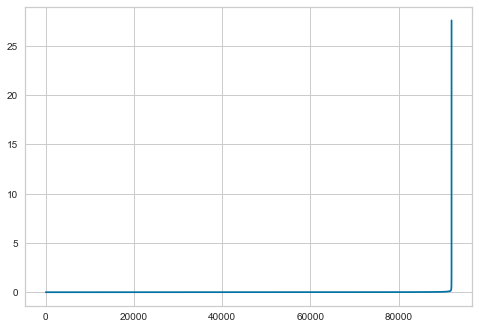

In [9]:
plt.plot(distances)

(91950.0, 91976.0)

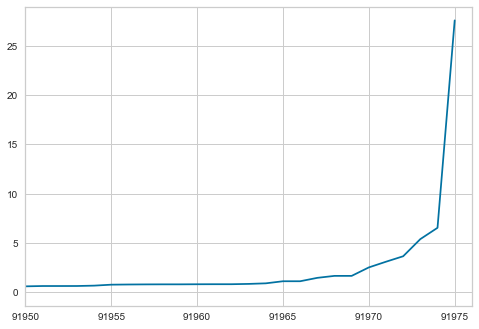

In [10]:
plt.plot(distances)
plt.xlim([91950, 91976])

In [11]:
pd.DataFrame(distances).describe()

,0
count,91976.000000
mean,0.006752
std,0.099167
min,0.000000
25%,0.000619
50%,0.002475
75%,0.006548
max,27.587783


In [15]:
np.percentile(distances,99)

0.0657027278010996

#### Faire varier epsilon 

Nous voulons faire varier epsilon pour étudier l'évolution du nombre de clusters.  
**NB** : Ne pas mettre epsilon à une trop haute valeur sinon le epsilon voisinage va être trop grand et la mémoire va saturer.

In [4]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt
import seaborn as sns

In [17]:
apsilon = np.arange(0.0066,0.066,0.005)
len(apsilon)


12

In [18]:
apsilon = np.arange(0.0066,0.066,0.005)
len(apsilon)

for eps in apsilon:
    m = DBSCAN(eps=eps)
    m.fit(data_X_rfm_scaled)
    print(f'pour epsilon = {eps}')
    print(f'Il y a {len(np.unique(m.labels_)) - 1} cluster')
    print(f'{np.count_nonzero(m.labels_ < 0)} clients ne sont associés à auccun cluster')

pour epsilon = 0.0066
Il y a 2455 cluster
44132 clients ne sont associés à auccun cluster
pour epsilon = 0.0116
Il y a 742 cluster
18019 clients ne sont associés à auccun cluster
pour epsilon = 0.016599999999999997
Il y a 438 cluster
11586 clients ne sont associés à auccun cluster
pour epsilon = 0.021599999999999998
Il y a 318 cluster
8801 clients ne sont associés à auccun cluster
pour epsilon = 0.0266
Il y a 254 cluster
7296 clients ne sont associés à auccun cluster
pour epsilon = 0.031599999999999996
Il y a 265 cluster
6088 clients ne sont associés à auccun cluster
pour epsilon = 0.036599999999999994
Il y a 253 cluster
4958 clients ne sont associés à auccun cluster
pour epsilon = 0.0416
Il y a 248 cluster
4175 clients ne sont associés à auccun cluster
pour epsilon = 0.046599999999999996
Il y a 235 cluster
3516 clients ne sont associés à auccun cluster
pour epsilon = 0.05159999999999999
Il y a 221 cluster
3009 clients ne sont associés à auccun cluster
pour epsilon = 0.0565999999999999

**Il y a donc un problème** : Trop de cluster ainsi que trop de clients non associés à des clusters.  
**Nous devons donc** : Modifier un second paramètre le **min_samples**

In [27]:
apsilon = np.arange(0.3,0.4,0.05)
min_samples_range = np.arange(15,20,1)
for msr in min_samples_range:
    print('*'*20)
    print(f'pour un min_samples = {msr}')
    for eps in apsilon:
        m = DBSCAN(eps=eps, min_samples=msr)
        m.fit(data_X_rfm_scaled)
        print(f'pour epsilon = {eps}')
        print(f'Il y a {len(np.unique(m.labels_)) - 1} cluster')
        print(f'{np.count_nonzero(m.labels_ < 0)} clients ne sont associés à auccun cluster')

********************
pour un mean_samples = 15
pour epsilon = 0.3
Il y a 6 cluster
537 clients ne sont associés à auccun cluster
pour epsilon = 0.35
Il y a 5 cluster
400 clients ne sont associés à auccun cluster
pour epsilon = 0.39999999999999997
Il y a 4 cluster
326 clients ne sont associés à auccun cluster
********************
pour un mean_samples = 16
pour epsilon = 0.3
Il y a 5 cluster
578 clients ne sont associés à auccun cluster
pour epsilon = 0.35
Il y a 5 cluster
418 clients ne sont associés à auccun cluster
pour epsilon = 0.39999999999999997
Il y a 4 cluster
346 clients ne sont associés à auccun cluster
********************
pour un mean_samples = 17
pour epsilon = 0.3
Il y a 4 cluster
601 clients ne sont associés à auccun cluster
pour epsilon = 0.35
Il y a 7 cluster
436 clients ne sont associés à auccun cluster
pour epsilon = 0.39999999999999997
Il y a 4 cluster
352 clients ne sont associés à auccun cluster
********************
pour un mean_samples = 18
pour epsilon = 0.3
Il y

Aprés des recherches nous avons trouvé des paramètres qui donnent le même nombe de clusters (5) que le Kmeans.  
**Les paramètres** : mean_samples = 15, epsilon = 0.35

Nous allons donc étudier ce clustering pour en évulaluer sa qualité

In [37]:
m = DBSCAN(eps=0.35, min_samples = 15)
m.fit(data_X_rfm_scaled)
print(f'{len(np.unique(m.labels_)) - 1}')

5


**L'indice Davies Bouldin :**   
Nous devons dans un premier temps enlever les points associés à auccun cluster

In [48]:
data_ = pd.DataFrame(data_X_rfm_scaled,columns =data_X_rfm.columns )
data_['labels'] = m.labels_

In [49]:
data_ = data_[data_['labels']>-1]

In [50]:
data_

,récence_x,fréquence,prix_total,labels
0,-3.188025,-0.175262,-0.130468,0
1,1.145638,5.705755,-0.126357,1
2,-2.998181,-0.175262,-0.559810,0
3,-2.998181,-0.175262,-0.495104,0
4,-2.998181,-0.175262,-0.142711,0
...,...,...,...,...
91971,1.551510,-0.175262,-0.409492,2
91972,1.551510,-0.175262,1.525775,2
91973,1.551510,-0.175262,-0.461690,2
91974,1.551510,-0.175262,-0.585710,2


In [51]:
davies_bouldin_score(data_[['récence_x','fréquence','prix_total']].values, data_['labels'].values)

0.33912932183612865

Nous obtenons un indice plus faible qu'avec le Kmeans.
Nous pourions naîvement en conclure que cela donne des clusters de meilleure qualité mais procédons à une visualisation 

#### Visualisation

[0.37611851 0.70903686]


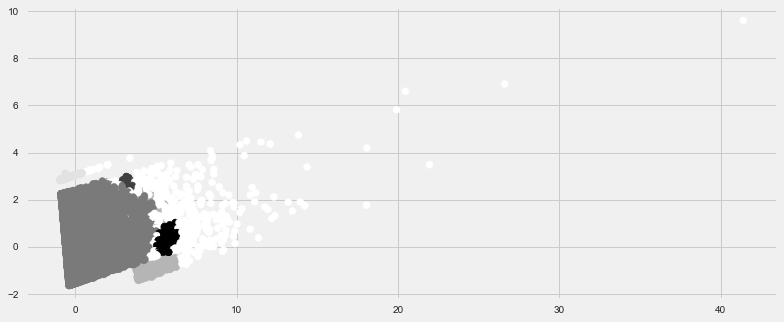

In [55]:
from sklearn import decomposition
plt.style.use("fivethirtyeight")
pca = decomposition.PCA(n_components = 2)
pca.fit(data_X_rfm_scaled)

print(pca.explained_variance_ratio_.cumsum())

X_trans = pca.transform(data_X_rfm_scaled)

fig = plt.figure(figsize = (12,5))
m = DBSCAN(eps=0.35, min_samples=15)
m.fit(data_X_rfm_scaled)
ax = fig.add_subplot(111)
ax.scatter(X_trans[:,0],X_trans[:,1], c = m.labels_ + 2)

Il semble qu'un cluster comporte la majorité des clients..

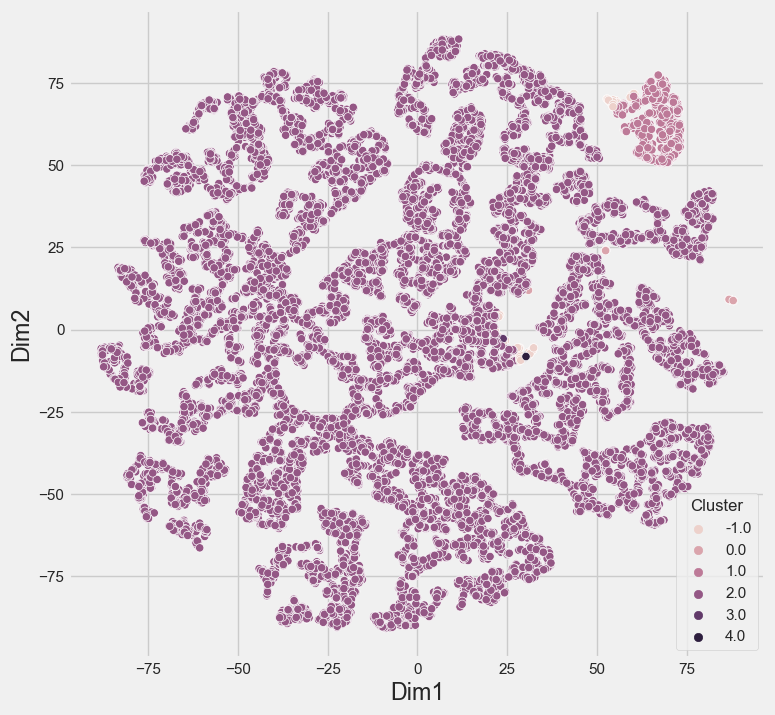

In [131]:
from sklearn.manifold import TSNE

scaler_rfm_sample = StandardScaler()
data_X_rfm_scaled = data_X[['récence_x','fréquence','prix_total']]
data_X_rfm_scaled = scaler_rfm_sample.fit_transform(data_X_rfm_scaled)
data_X_label = data_X[['récence_x','fréquence','prix_total']]


m = DBSCAN(eps=0.35, min_samples=15)
m.fit(data_X_rfm_scaled)
data_X_label['Cluster'] = m.labels_

data_X_sample = data_X_label.sample(20000, random_state=42)

data_X_rfm_sample_scaled = scaler_rfm_sample.fit_transform(data_X_sample[['récence_x','fréquence','prix_total']])
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(data_X_rfm_sample_scaled)


X_tsne_data = np.vstack((X_tsne.T, data_X_sample['Cluster'].values)).T
df_tsne = pd.DataFrame(X_tsne_data, columns=['Dim1', 'Dim2', 'Cluster'])
plt.figure(figsize=(8, 8))
sns.scatterplot(data=df_tsne, hue= 'Cluster', x='Dim1', y='Dim2')
plt.show()

**Nombre de clients par cluster**

In [62]:
data_['labels'].value_counts()

2    88666
1     2586
0      234
4       71
3       19
Name: labels, dtype: int64

Comme nous l'avions anticipé le cluster 2 contient la grande majorité des clients. Les cluster 0, 4, 3 sont vraiment trop petits. Ce qui n'est pas pertinent d'un point de vu métier.

**En conclusion pour le DBSCAN :**

Du fait de son fonctionnement, le DBSCAN n'est pas adapté à nos données.  
Nous pourrions tenter de faire le même test en ajoutant de nouvelles variables mais les méthodes à densité comportent des lacunes quand la dimension augmente.  
Comme nous l'avons vu, déterminer les bons paramètres (epsilon et min_samples) n'est pas évident, le temps de calcul et la mémoire utilisée sont importants.

## Clustering Agglomératif

on commence par considérer que chaque point est un cluster à lui tout seul. Ensuite, on trouve les deux clusters les plus proches, et on les agglomère en un seul cluster. On répète cette étape jusqu'à ce que tous les points appartiennent à un seul cluster, constitué de l'agglomération de tous les clusters initiaux.

In [67]:
# Nous devons travailler avec seulement une partie des données sinon l'ordinateur plente

data_X_sample = data_X.sample(10000, random_state=42)
# On isole nos features RFM
data_X_rfm_sample = data_X_sample[['récence_x','fréquence','prix_total']]
# On normalise dans un premier temps les données
scaler_rfm_sample = StandardScaler()
data_X_rfm_sample_scaled = scaler_rfm_sample.fit_transform(data_X_rfm_sample)

In [69]:
len(data_X_rfm_sample_scaled)

10000

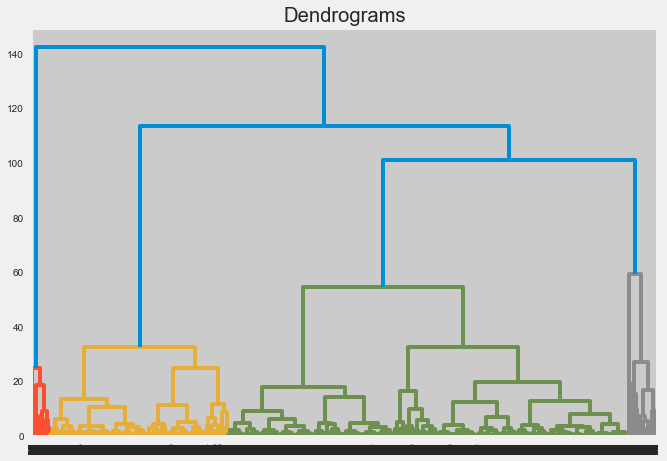

In [70]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(data_X_rfm_sample_scaled, method='ward'))

In [74]:
from sklearn.cluster import AgglomerativeClustering 
hc = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage ='ward')
y_hc=hc.fit_predict(data_X_rfm_sample_scaled)

[0.37385609 0.70675676]


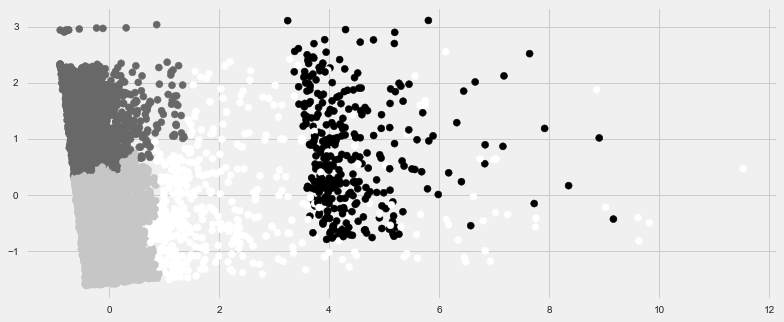

In [78]:
from sklearn import decomposition
plt.style.use("fivethirtyeight")
pca = decomposition.PCA(n_components = 2)
pca.fit(data_X_rfm_sample_scaled)

print(pca.explained_variance_ratio_.cumsum())

X_trans = pca.transform(data_X_rfm_sample_scaled)

fig = plt.figure(figsize = (12,5))
ax = fig.add_subplot(111)
ax.scatter(X_trans[:,0],X_trans[:,1], c =y_hc)

In [79]:
data_sample_ = pd.DataFrame(data_X_rfm_sample_scaled,columns = data_X_rfm.columns )
data_sample_['labels'] = y_hc
davies_bouldin_score(data_sample_[['récence_x','fréquence','prix_total']].values, y_hc)

0.6796499280529874

**Analyse du clustering**

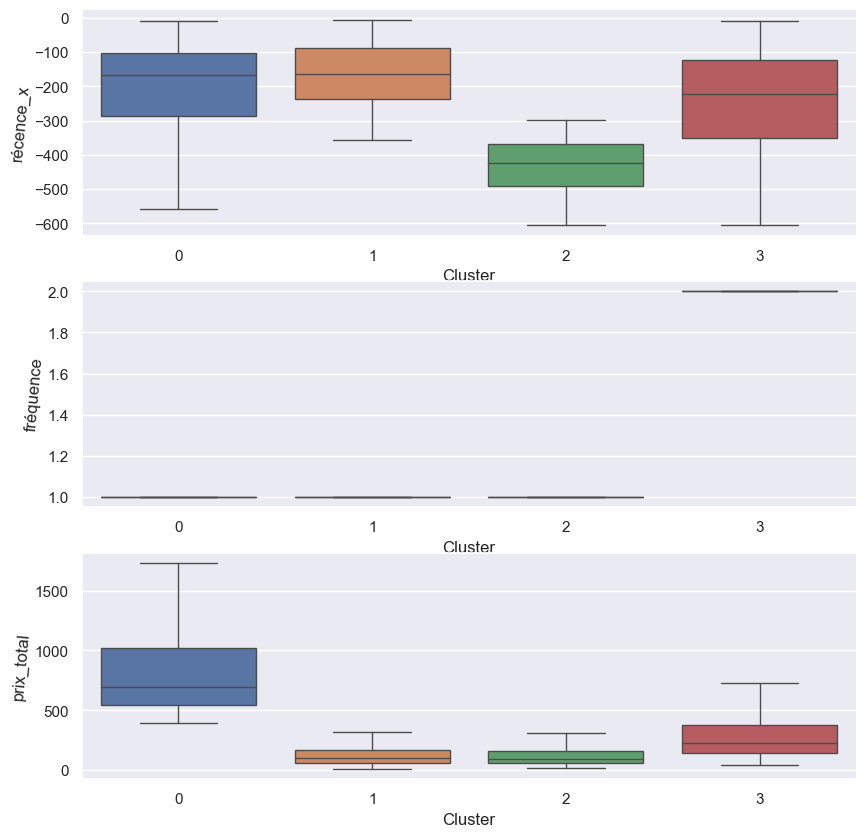

In [81]:
data_X_labaled = data_X_rfm_sample.copy()
data_X_labaled['Cluster'] =  y_hc

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(10, 10))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='Cluster', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

**Nous avons ici une répartition des clusters similaire au Kmeans :**
    - Un cluster pour la féquence > 1  
    - Un cluster pour les montants élevés  
    - Deux autres clusters qui n'ayant pas ces particularités sont divisés en fonction de la récence (anciens/nouvaux clients), et pour rappel nous avions 3 groupes dans le Kmeans

**Nous allons faire le même test avec l'ajout des autres variables rfmp :**

In [88]:
data_X_rfmrp_sample = data_X_sample[['récence_x','fréquence','prix_total','review_score','payment_installments']]
def lambda_paiement(x):
    res = 1
    if x > 1 :
        res = 2
    return res

data_X_rfmrp_sample['payment_installments'] = data_X_rfmrp_sample['payment_installments'].apply(lambda_paiement)
# On normalise dans un premier temps les données
scaler_rfmrp_sample = StandardScaler()
data_X_rfmrp_sample_scaled = scaler_rfm_sample.fit_transform(data_X_rfmrp_sample)

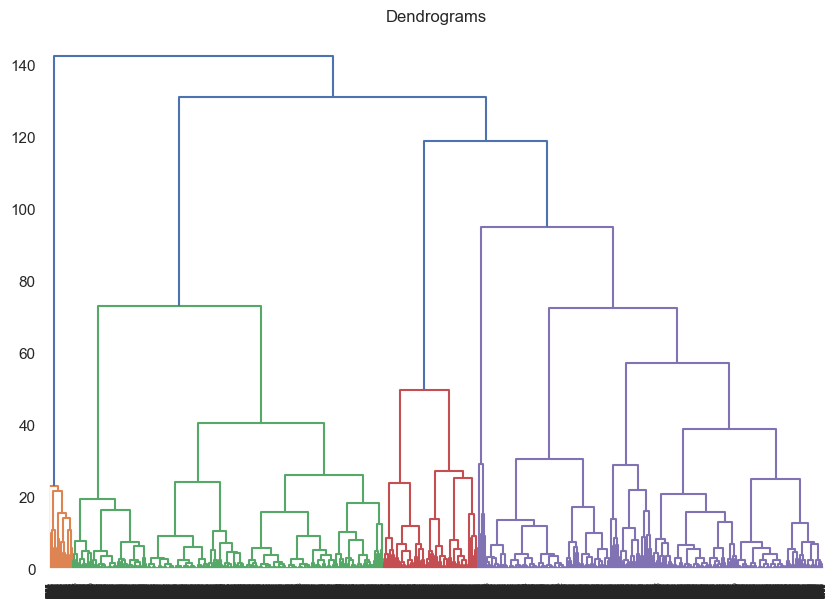

In [89]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(data_X_rfmrp_sample_scaled, method='ward'))

Le dendogramme nous suggére d'utiliser 7 clusters. 

**Visualisation**

[0.24916122 0.4544001 ]


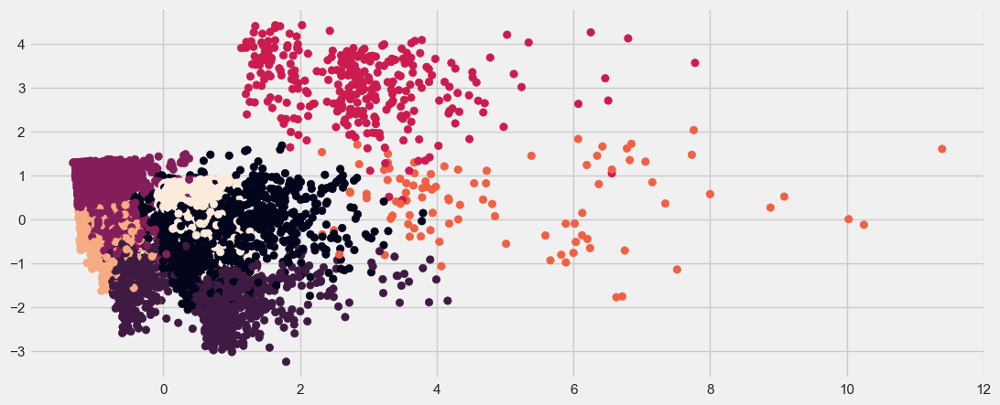

In [96]:
from sklearn.cluster import AgglomerativeClustering 
hc = AgglomerativeClustering(n_clusters = 7, affinity = 'euclidean', linkage ='ward')
y_hc=hc.fit_predict(data_X_rfmrp_sample_scaled)

from sklearn import decomposition
plt.style.use("fivethirtyeight")
pca = decomposition.PCA(n_components = 2)
pca.fit(data_X_rfmrp_sample_scaled)

print(pca.explained_variance_ratio_.cumsum())

X_trans = pca.transform(data_X_rfmrp_sample_scaled)

fig = plt.figure(figsize = (12,5))
ax = fig.add_subplot(111)
ax.scatter(X_trans[:,0],X_trans[:,1], c =y_hc)

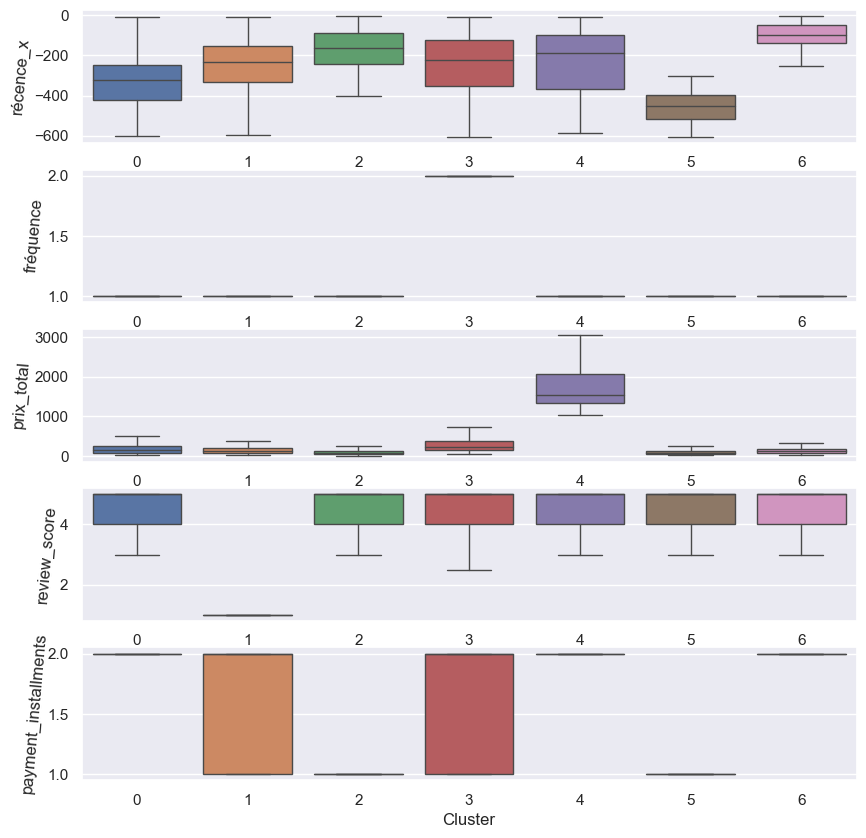

In [95]:
data_X_labaled = data_X_rfmrp_sample.copy()
data_X_labaled['Cluster'] =  y_hc

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(10, 10))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='Cluster', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

In [97]:
data_X_labaled.groupby(by ="Cluster").describe()

récence_x                                                              \
            count        mean         std    min     25%    50%    75%    max   
Cluster                                                                         
0          2752.0 -336.331759  118.658894 -698.0 -424.00 -323.0 -250.0   -9.0   
1          1219.0 -249.871206  138.837523 -694.0 -332.50 -233.0 -152.5  -11.0   
2          3054.0 -166.856582   94.228564 -404.0 -241.00 -164.0  -88.0   -5.0   
3           308.0 -238.957792  146.435058 -606.0 -350.25 -222.5 -122.5   -8.0   
4            94.0 -229.319149  164.270313 -584.0 -366.50 -186.5  -96.0   -9.0   
5           958.0 -456.291232   74.906028 -698.0 -515.00 -452.0 -397.0 -304.0   
6          1615.0  -98.500310   56.568004 -253.0 -140.00  -97.0  -47.0   -6.0   

        fréquence       ... review_score      payment_installments            \
            count mean  ...          75%  max                count      mean   
Cluster                 ...                                                    
0          2752.0  1.0  ...          5.0  5.0               2752.0  1.954942   
1          1219.0  1.0  ...          1.0  3.0               1219.0  1.538966   
2          3054.0  1.0  ...          5.0  5.0               3054.0  1.000000   
3           308.0  2.0  ...          5.0  5.0                308.0  1.623377   
4            94.0  1.0  ...          5.0  5.0                 94.0  1.776596   
5           958.0  1.0  ...          5.0  5.0                958.0  1.000000   
6          1615.0  1.0  ...          5.0  5.0               1615.0  2.000000   

                                            
              std  min  25%  50%  75%  max  
Cluster                                     
0        0.207469  1.0  2.0  2.0  2.0  2.0  
1        0.498684  1.0  1.0  2.0  2.0  2.0  
2        0.000000  1.0  1.0  1.0  1.0  1.0  
3        0.485328  1.0  1.0  2.0  2.0  2.0  
4        0.418760  1.0  2.0  2.0  2.0  2.0  
5        0.000000  1.0  1.0  1.0  1.0  1.0  
6        0.000000  2.0  2.0  2.0  2.0  2.0  

[7 rows x 40 columns]

**Analyse :** 
A l'instar du Kmeans nous avons :
    - Un cluster pour les fréquences élevées (N°3)
    - Un cluster pout les montants élevés (N°4)
    - Un cluster pour les clients insatisfaits (N°1)
    - Ensuite 2 paires de clusters en fonction de la récence (N°0, N°5) et (N°2, N°6)
    
    La similitude entre les deux paires de cluster n'est pas aussi marquée que dans le Kmeans. Cela s'explique en partie
    car nous travaillons avec seulement une partie des données.

# En conclusion sur la partie essai :

Nous avions dans un premier temps utilisé trop de variables, (cette partie se trouve à la fin de ce notebook) ce qui a rendu l'analyse des clusters trop difficile d'un point de vue métier.

Nous nous sommes donc restraint dans un premier temps aux variables RFM en utilisant un Kmeans. Le résultat était concluant donc nous avons ajouté deux autres variables : la satisfaction et le nombre de payments. Et nous sommes arrivés à un clustering exploitable.

La méthode du DBSCAN a était testé sans grand succés : difficile de trouver les bons paramètres epsilon et min_samples pour avoir un nombre raisonable de cluster. Lors de visualisation nous avons bien constaté qu'un cluster dominé en nombre tous les autres. Ces difficultés nous ont poussé à écarter cette méthode de clustering.

La méthode de clustering agglomératif donne des résultats similaires au Kmeans. Mais par sa compléxité nous avons utilisé seulement une partie des données. 

Le Kmeans s'impose donc comme notre premier choix. Il faut maintenant Proposer un contrat de maintenance en étudiant la stabilité des clusters dans le temps.

In [87]:
data_X_rfmrp_sample

,récence_x,fréquence,prix_total,review_score,payment_installments
23673,-350,1,457.80,5.0,8.0
63661,-144,1,39.44,3.0,1.0
61080,-156,1,117.27,5.0,3.0
62427,-150,1,68.87,5.0,1.0
91863,-8,1,111.70,5.0,10.0
...,...,...,...,...,...
85199,-36,1,558.62,5.0,1.0
77389,-78,1,75.20,4.0,3.0
71917,-110,1,71.83,5.0,1.0
33261,-284,1,66.67,5.0,1.0


# Kmeans

In [4]:
# On prépare un échantillon pour les temps de calculs

data_X_sample = data_X.sample(10000, random_state=42)

In [5]:
scaler = StandardScaler()

data_X_scaled = scaler.fit_transform(data_X_sample)

In [6]:
kmeans_params = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

kmeans = KMeans(n_clusters=3, **kmeans_params)

In [7]:
kmeans.fit(data_X_scaled)

KMeans(init='random', n_clusters=3, random_state=42)

In [8]:
# La valeur SSE la plus faible
kmeans.inertia_

105537.86426289011

In [9]:
# Emplacements finaux du centroïde
kmeans.cluster_centers_

array([[-4.60477802e-01,  2.96952060e-02,  7.11128219e-01,
        -5.93355825e-02, -3.96989434e-02,  9.10403915e-02,
         9.59564471e-02,  8.60336388e-01,  3.78834732e-01,
         8.46566066e-01,  4.60030667e-01,  5.59086196e+00,
        -7.96463678e-02],
       [-9.53260489e-01, -9.72286970e-01, -2.35160020e-02,
         5.18289241e-03,  7.90948408e-03, -3.54760603e-03,
         1.15983735e-01,  2.56477233e-02, -4.98486018e-02,
        -1.63189150e-02, -3.81557161e-02, -1.78266056e-01,
         3.54506518e-02],
       [ 7.33546747e-01,  7.20440454e-01, -2.20495471e-02,
        -5.52175984e-04, -3.66826034e-03, -2.42400074e-03,
        -9.14697661e-02, -6.68529115e-02,  1.59710111e-02,
        -3.49203013e-02,  2.77533381e-03, -1.78266056e-01,
        -2.19026190e-02]])

In [10]:
# Le nombre d'itérations nécessaires pour converger
kmeans.n_iter_

10

In [11]:
# Une liste contient les valeurs SSE pour chaque k
sse = []
for k in tqdm(range(1, 15)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_scaled)
    sse.append(kmeans.inertia_)

  0%|          | 0/14 [00:00<?, ?it/s]

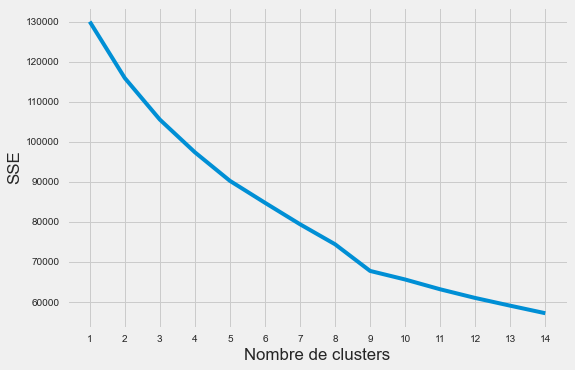

In [12]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 15), sse)
plt.xticks(range(1, 15))
plt.xlabel("Nombre de clusters")
plt.ylabel("SSE")
plt.show()

In [13]:
kl = KneeLocator(range(1, 15), sse, curve="convex", direction="decreasing")
kl.elbow

9

ici 9 semble être la valeur optimale, ensuite la variance intercluster diminue plus lentement

### Essai avec Yellowbrick

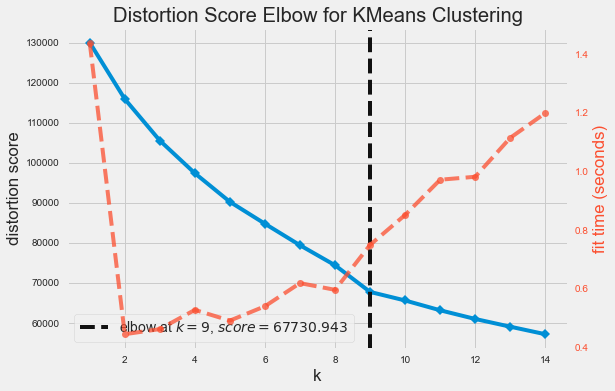

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [14]:
model = KMeans(**kmeans_params)
visualizer = KElbowVisualizer(model, k=(1, 15))
visualizer.fit(data_X_scaled)
visualizer.show()

## Coefficient de silhouette

In [15]:
# Une liste contient les coefficients de silhouette pour chaque k
silhouette_coefficients = []

# Notez que vous commencez à 2 clusters pour le coefficient de silhouette.
for k in tqdm(range(2, 15)):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(data_X_scaled)
    score = silhouette_score(data_X_scaled, kmeans.labels_)
    silhouette_coefficients.append(score)

  0%|          | 0/13 [00:00<?, ?it/s]

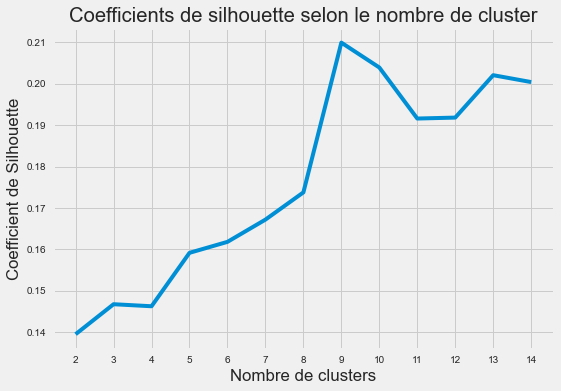

In [16]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 15), silhouette_coefficients)
plt.xticks(range(2, 15))
plt.xlabel("Nombre de clusters")
plt.ylabel("Coefficient de Silhouette")
plt.title("Coefficients de silhouette selon le nombre de cluster")
plt.show()

9 semble bien être le coefficient optimal de silhouette

## Visualisation du profile des silhouette par cluster

  0%|          | 0/13 [00:00<?, ?it/s]

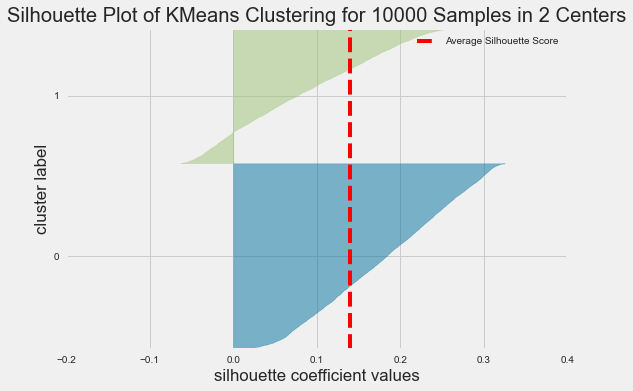

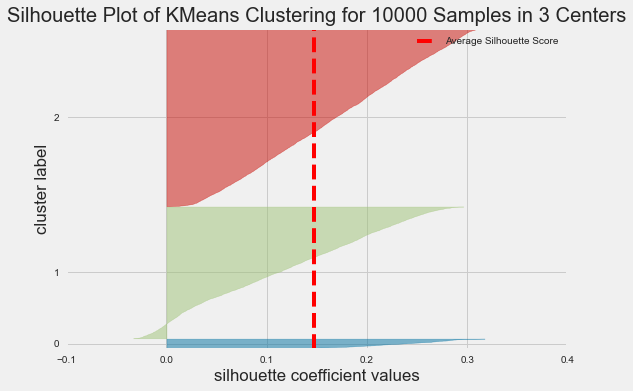

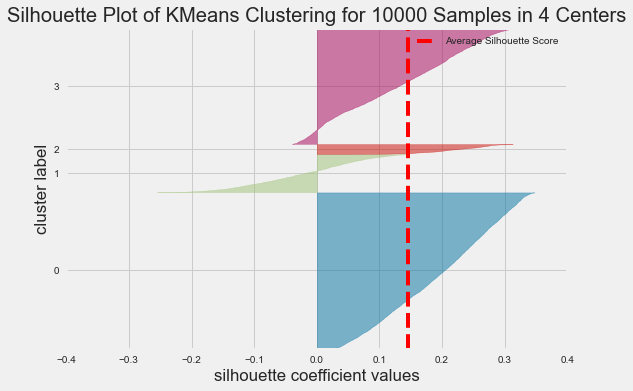

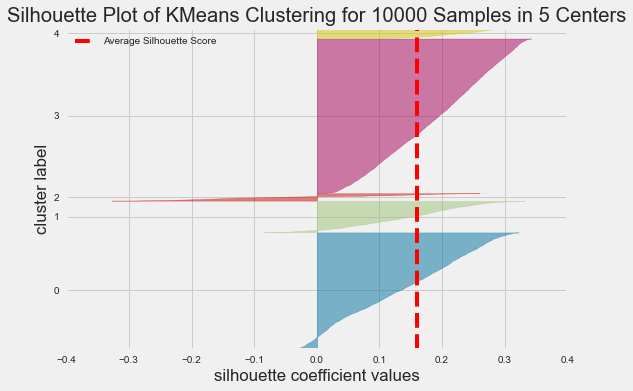

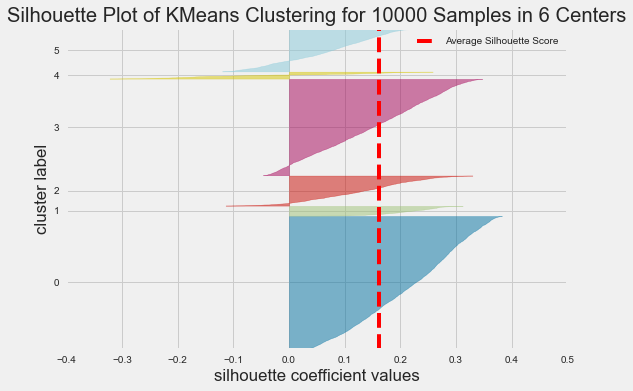

...

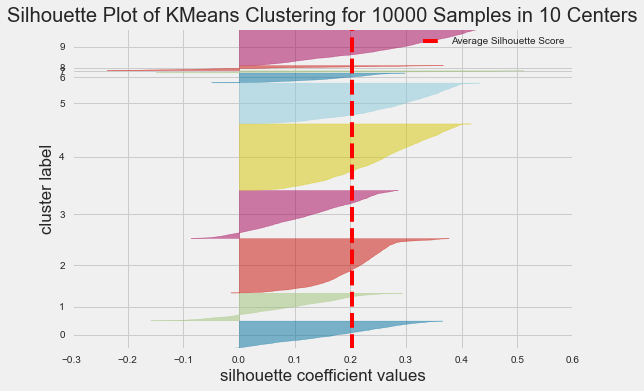

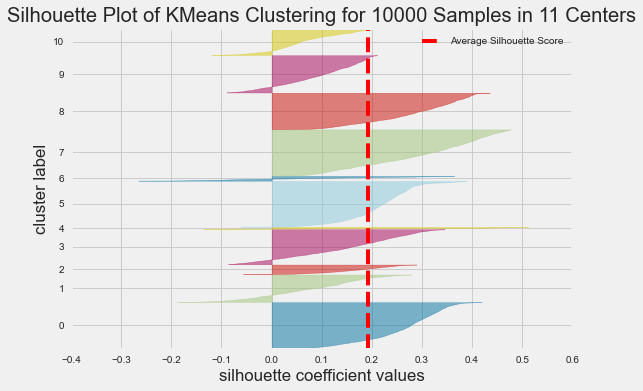

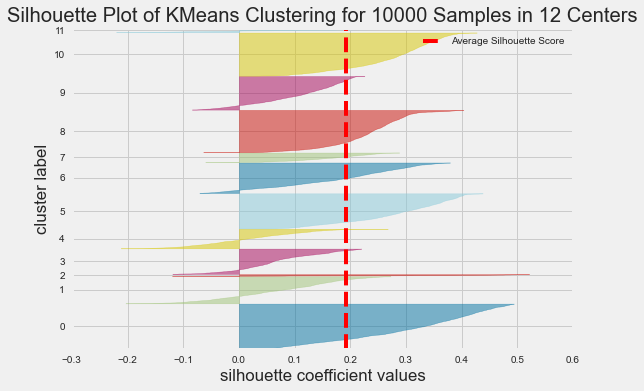

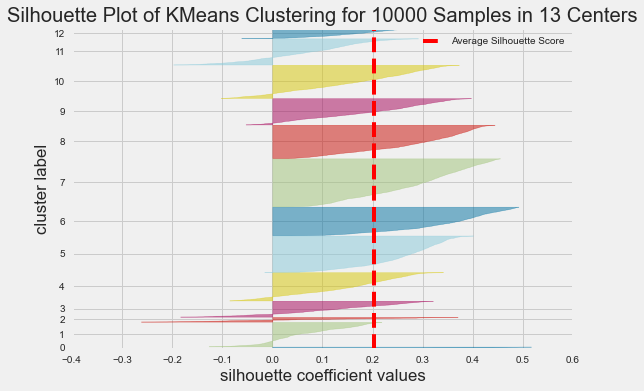

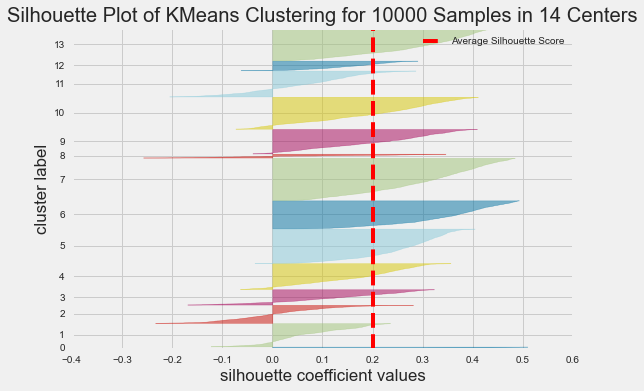

In [16]:
from yellowbrick.cluster import intercluster_distance
# Instanciation du modèle de clustering et du visualiseur

for n_cluster in tqdm(range(2, 15)):
    model = KMeans(n_cluster, **kmeans_params)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(data_X_scaled)  # Adapter les données au visualiseur
    visualizer.show()  # afficher la silhouette

## Visualiser un cluster par ACP

Nous voulons visualiser nos cluster sur un plan, pour cela nous utilisons une ACP

In [17]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 9)
pca.fit(data_X_scaled)

print(pca.explained_variance_ratio_.cumsum())
X_trans = pca.transform(data_X_scaled)

[0.15441564 0.28179146 0.39137068 0.49217406 0.58783051 0.67714524
 0.7591896  0.83427055 0.90060362]


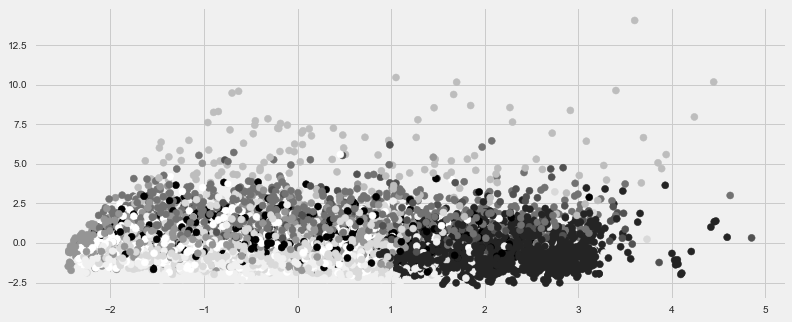

In [18]:
fig = plt.figure(figsize = (12,5))
cls = cluster.KMeans(n_clusters=9)
cls.fit(X_trans)
ax = fig.add_subplot(111)
ax.scatter(X_trans[:,0],X_trans[:,1], c = cls.labels_)

In [19]:
cls.labels_

array([0, 1, 0, ..., 2, 2, 5])

In [20]:
test = pd.DataFrame(X_trans)
test['label'] = cls.labels_
fig = px.scatter_matrix(
    test,
    dimensions=list(np.arange(9)),
    color="label"
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [21]:
import plotly.express as px
from sklearn.decomposition import PCA

df = px.data.iris()
features = ["sepal_width", "sepal_length", "petal_width", "petal_length"]

pca = decomposition.PCA(n_components = 9)
pca.fit(data_X_scaled)
X_trans = pca.transform(data_X_scaled)
test = pd.DataFrame(X_trans)
test['label'] = cls.labels_
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    test,
    labels=labels,
    dimensions=range(4),
    color=test['label']
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [41]:
pca = decomposition.PCA(n_components = 9)
pca.fit(data_X_scaled)
X_trans = pca.transform(data_X_scaled)
test = pd.DataFrame(X_trans)
test['label'] = cls.labels_

## Interpréter les cluster

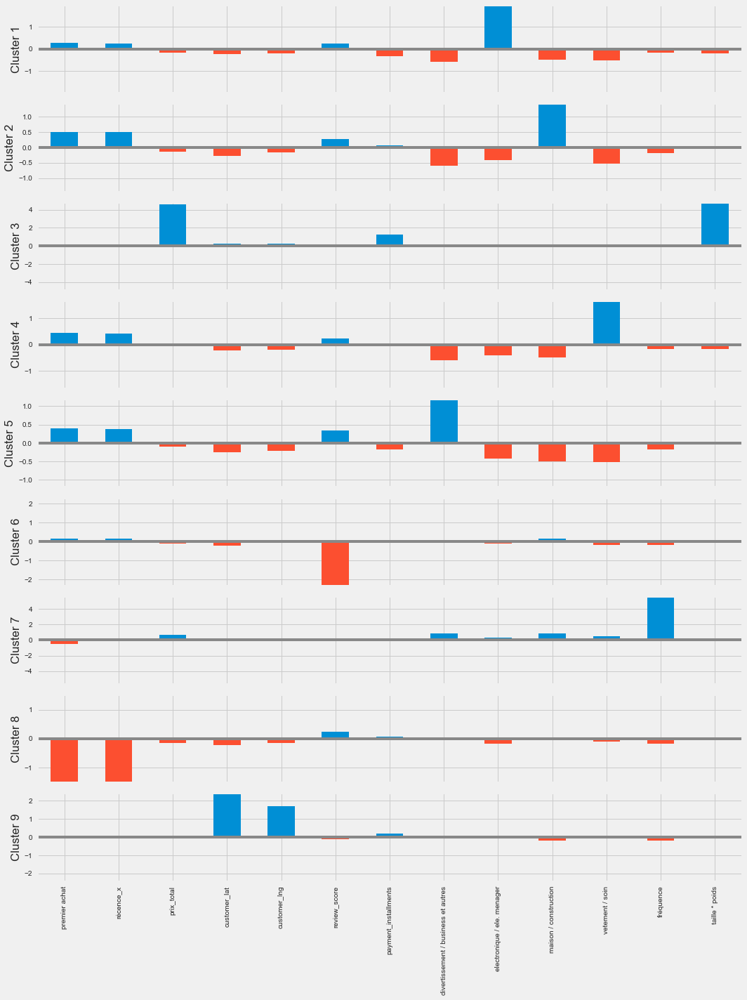

In [38]:
syms = data_X.columns.values
kmeans = KMeans(n_clusters=9).fit(data_X_scaled)
centers = pd.DataFrame(kmeans.cluster_centers_, columns=syms)

f, axes = plt.subplots(9, 1, figsize=(15, 20), sharex=True)
for i, ax in enumerate(axes):
    center = centers.loc[i, :]
    maxPC = 1.01 * np.max(np.max(np.abs(center)))
    colors = ['C0' if l > 0 else 'C1' for l in center]
    ax.axhline(color='#888888')
    center.plot.bar(ax=ax, color=colors)
    ax.set_ylabel(f'Cluster {i + 1}')
    ax.set_ylim(-maxPC, maxPC)

plt.tight_layout()
plt.show()

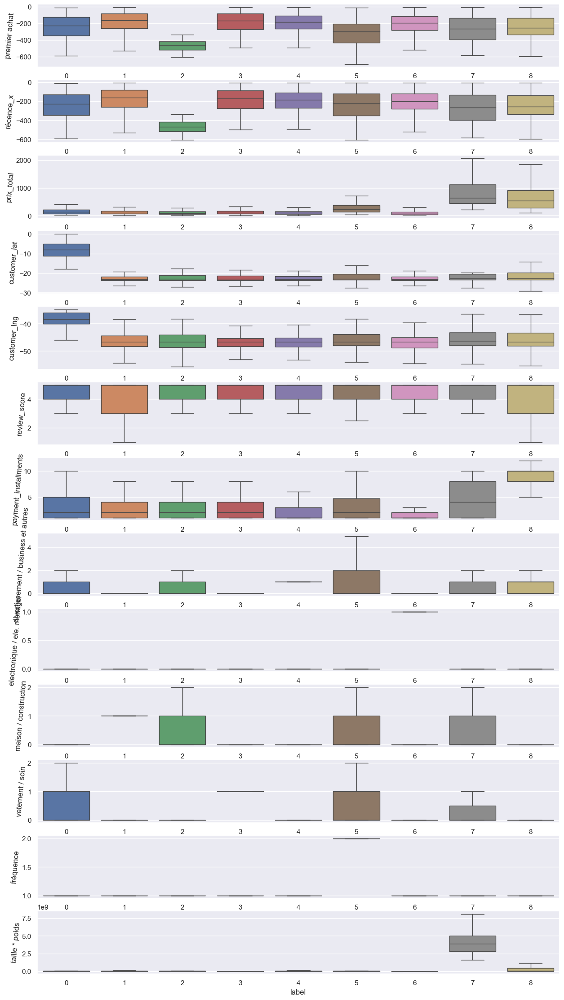

In [92]:
cls = cluster.KMeans(n_clusters=9)
cls.fit(X_trans)
data_X_labaled = data_X_sample.copy()
data_X_labaled['label'] =  cls.labels_

plt.style.use('default')
sns.set_theme(style="darkgrid")
liste_variables = data_X_labaled.columns[:-1].values
fig, axs = plt.subplots(nrows=len(liste_variables),  figsize=(15, 28))
for i, col_ in enumerate(liste_variables):
    sns.boxplot(x='label', y= col_, data=data_X_labaled, ax=axs[i],showfliers = False, linewidth=1)
    axs[i].set_ylabel(col_ ,rotation=85)
    

fig.show()

### Nombre par cluster

In [93]:
from collections import Counter
print(Counter(kmeans.labels_))

Counter({4: 1931, 7: 1674, 3: 1531, 1: 1485, 0: 1164, 8: 875, 5: 866, 6: 306, 2: 168})


# Clustering hierarchique

In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, cophenet
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
import sklearn.metrics as sm
from sklearn.decomposition import PCA

We have chosen ‘Ward’ as the linkage — In this method, the proximity between the two clusters is defined as the increase in the SSE (the sum of the squared distances to the cluster centers) that results from merging two clusters.

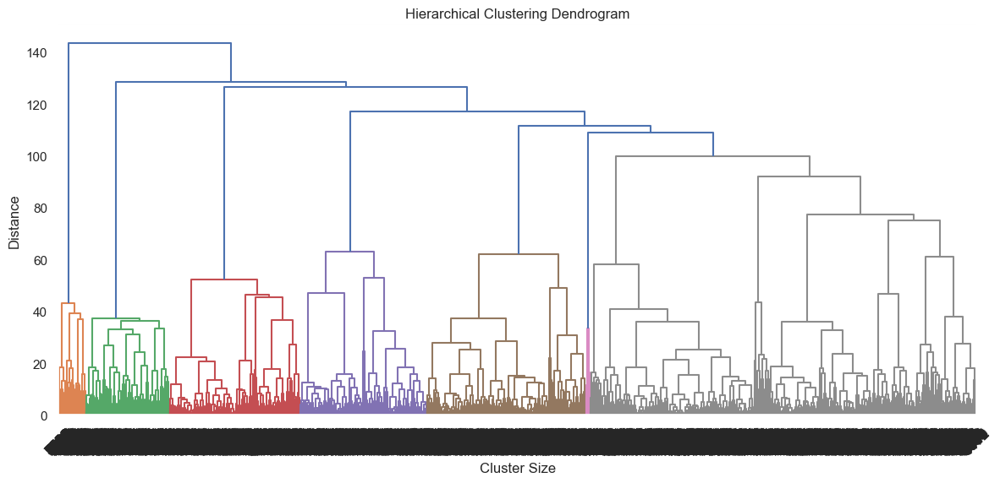

In [98]:
Z=linkage(data_X_scaled,'ward')

# Plotting Dendogram
dendrogram(Z, leaf_rotation=45., leaf_font_size=12.)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.rcParams["figure.figsize"] = (14,6)
plt.show()

ValueError: x and y must have same first dimension, but have shapes (31,) and (9999,)

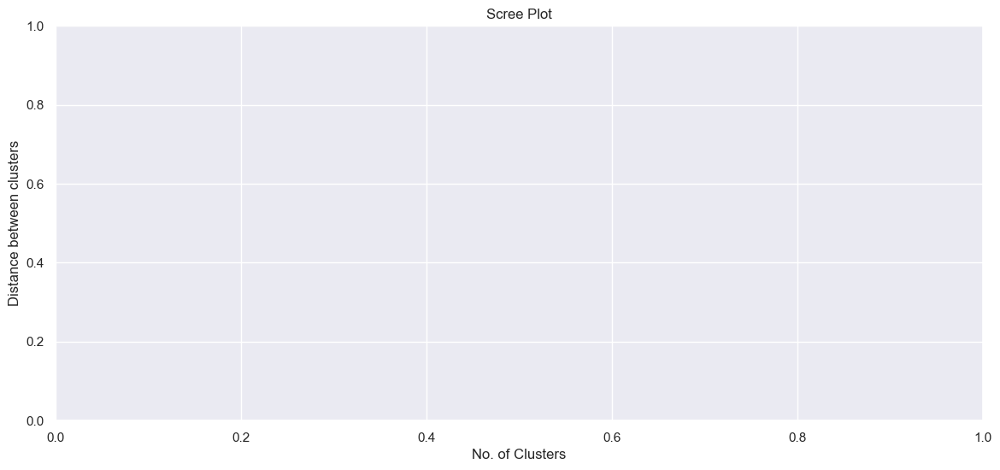

In [100]:
y=[]
# Appending distance between clusters at every iteration in for loop
for k in range(2,33):
    Hclustering = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward', compute_distances=True).fit(data_X_scaled)
    y.append(Hclustering.distances_)
    #print(y)
    


ValueError: x and y must have same first dimension, but have shapes (31,) and (9999,)

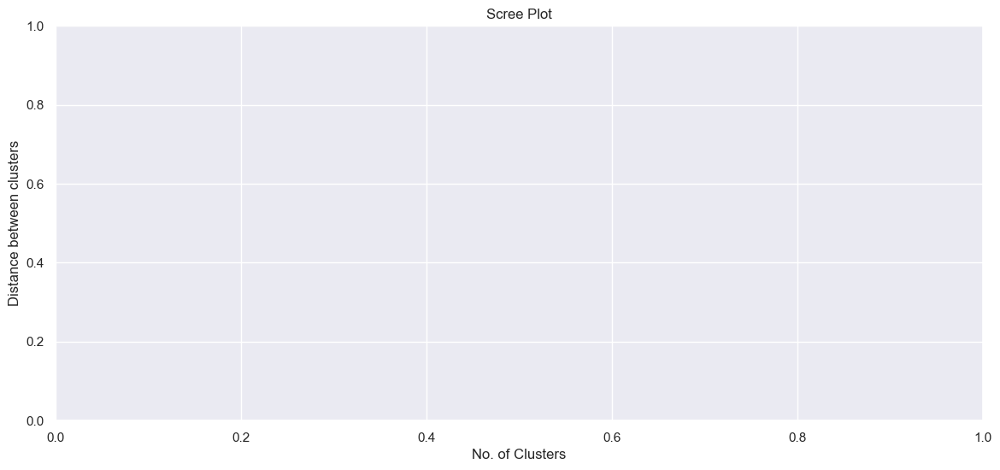

In [101]:
# X values = Number of clusters in decending order
x = np.array([i for i in range(32,1,-1)])

# Y values = Distance between clusters
y = np.array(y) 

plt.title('Scree Plot')
plt.xlabel('No. of Clusters')
plt.ylabel('Distance between clusters')
plt.plot(x,y, marker='o')

In [102]:
y

array([9.96667098e-03, 1.33984150e-02, 1.67658776e-02, ...,
       1.26737114e+02, 1.28725009e+02, 1.43415910e+02])